En el presente documento se detalla el desarrollado del concurso. Se adjunta un indice para poder viasualizar mejor el procedimiento y un orden. 



# INDICE

- PASO 1: PASO 1: CARGA DE DATOS. UNION DE DATAFRAMES DE TRAIN
- PASO 2: VISTA PRELIMINAR DE LOS DATOS
- PASO 3: ANALISIS DE VARIABLES Y DEPURACION
    - PASO 3.1: ELIMINAR VARIABLES
    - PASO 3.2 TARGET
- PASO 4: GUARDAR DATASET DEPURADO ('df_train_limpio.csv')
- PASO 5: CON DATOS LIMPIOS, TRANSFORMAR TODAS LAS VARIABLES A NUMERICAS
- PASO 6: CARGA, LIMPIEZA Y PREPARACION DE LOS DATOS DE TEST (test_set_values.csv)
    - PASO 6.1: Carga de datos TEST
    - PASO 6.2: Vista preliminar de los datos TEST
    - PASO 6.3: Analisis de variables y limpieza de los datos TEST
    - PASO 6.4 Eliminar variables TEST
    - PASO 6.5: Guardar dataset depurado de los datos TEST
    - PASO 6.6: Datos TEST limpios, transformar todas las variables a numericas 
- PASO 7: MUESTREAR LOS DATOS de train, CONSTRUYENDO UN DATASET DE TRAIN Y TEST
- PASO 8: CONSTRUIR UN MODELO ANALITICO DE CLASIFICACION QUE SEA CAPAZ DE PREDECIR 'status_group'
    - DecisionTreeClassifier (arbol de decision)
    - RandomForestClassifier
    - Linear Support Vector Classification (LinearSVC)
    - FORMA AUTOMATICA DE COMPARAR DIFERENTES ALGORITMOS
    - Tuning hiperparámetros
    - SMOTE
- PASO 9: AUTOMATIZACION
- PASO 10: CON LOS DATOS DE TEST, VAMOS A PREDECIR



## Score final obtenido:
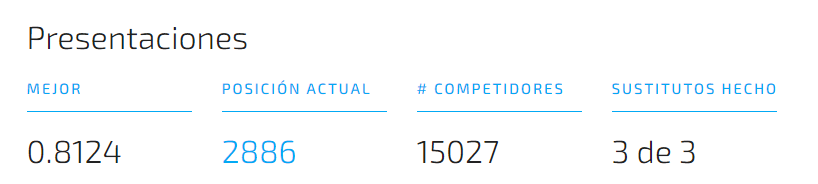

In [1]:
# Analisis de datos y operaciones matematicas
import pandas as pd #manipulación y análisis de datos 
import numpy as np #funciones matemáticas

# Fechas
from datetime import datetime #módulo proporciona clases para manipular fechas y horas

# Figuras y Graficos
%matplotlib inline
import matplotlib
import matplotlib.pyplot as plt #crear visualizaciones estáticas, animadas e interactivas. Figuras
plt.rcParams['axes.labelsize'] = 10
plt.rcParams['xtick.labelsize'] = 10
plt.rcParams['ytick.labelsize'] = 10
import seaborn as sns #interfaz para dibujar gráficos estadísticos atractivos e informativos
sns.set()

# Operaciones con expresiones regulares
import re


# Seleción de variables.
from sklearn.feature_selection import SelectKBest

# Modelos Selección.
from sklearn.model_selection import train_test_split
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import GridSearchCV, StratifiedKFold

# Modelos.
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.svm import LinearSVC
from xgboost import XGBClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.ensemble import AdaBoostClassifier
from sklearn.linear_model import LassoCV
from sklearn.linear_model import RidgeClassifierCV
from sklearn.svm import SVC
from sklearn.model_selection import RepeatedStratifiedKFold

# Preprocesado.
from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import LabelEncoder

from imblearn.over_sampling import SMOTE
import pickle

# Métricas.
from sklearn.metrics import classification_report
from sklearn.metrics import accuracy_score, auc, confusion_matrix, f1_score, precision_score, recall_score, roc_curve, classification_report

# PASO 1: CARGA DE DATOS. UNION DE DATAFRAMES DE TRAIN

In [2]:
# Lectura de datos
df_train_set=pd.read_csv("training_set_values.csv")
df_train_labels=pd.read_csv("training_set_labels.csv")

In [3]:
df_train_set

,id,amount_tsh,date_recorded,funder,gps_height,installer,longitude,latitude,wpt_name,num_private,...,payment_type,water_quality,quality_group,quantity,quantity_group,source,source_type,source_class,waterpoint_type,waterpoint_type_group
0,69572,6000.0,2011-03-14,Roman,1390,Roman,34.938093,-9.856322,none,0,...,annually,soft,good,enough,enough,spring,spring,groundwater,communal standpipe,communal standpipe
1,8776,0.0,2013-03-06,Grumeti,1399,GRUMETI,34.698766,-2.147466,Zahanati,0,...,never pay,soft,good,insufficient,insufficient,rainwater harvesting,rainwater harvesting,surface,communal standpipe,communal standpipe
2,34310,25.0,2013-02-25,Lottery Club,686,World vision,37.460664,-3.821329,Kwa Mahundi,0,...,per bucket,soft,good,enough,enough,dam,dam,surface,communal standpipe multiple,communal standpipe
3,67743,0.0,2013-01-28,Unicef,263,UNICEF,38.486161,-11.155298,Zahanati Ya Nanyumbu,0,...,never pay,soft,good,dry,dry,machine dbh,borehole,groundwater,communal standpipe multiple,communal standpipe
4,19728,0.0,2011-07-13,Action In A,0,Artisan,31.130847,-1.825359,Shuleni,0,...,never pay,soft,good,seasonal,seasonal,rainwater harvesting,rainwater harvesting,surface,communal standpipe,communal standpipe
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
59395,60739,10.0,2013-05-03,Germany Republi,1210,CES,37.169807,-3.253847,Area Three Namba 27,0,...,per bucket,soft,good,enough,enough,spring,spring,groundwater,communal standpipe,communal standpipe
59396,27263,4700.0,2011-05-07,Cefa-njombe,1212,Cefa,35.249991,-9.070629,Kwa Yahona Kuvala,0,...,annually,soft,good,enough,enough,river,river/lake,surface,communal standpipe,communal standpipe
59397,37057,0.0,2011-04-11,NaN,0,NaN,34.017087,-8.750434,Mashine,0,...,monthly,fluoride,fluoride,enough,enough,machine dbh,borehole,groundwater,hand pump,hand pump
59398,31282,0.0,2011-03-08,Malec,0,Musa,35.861315,-6.378573,Mshoro,0,...,never pay,soft,good,insufficient,insufficient,shallow well,shallow well,groundwater,hand pump,hand pump


In [4]:
df_train_set

,id,amount_tsh,date_recorded,funder,gps_height,installer,longitude,latitude,wpt_name,num_private,...,payment_type,water_quality,quality_group,quantity,quantity_group,source,source_type,source_class,waterpoint_type,waterpoint_type_group
0,69572,6000.0,2011-03-14,Roman,1390,Roman,34.938093,-9.856322,none,0,...,annually,soft,good,enough,enough,spring,spring,groundwater,communal standpipe,communal standpipe
1,8776,0.0,2013-03-06,Grumeti,1399,GRUMETI,34.698766,-2.147466,Zahanati,0,...,never pay,soft,good,insufficient,insufficient,rainwater harvesting,rainwater harvesting,surface,communal standpipe,communal standpipe
2,34310,25.0,2013-02-25,Lottery Club,686,World vision,37.460664,-3.821329,Kwa Mahundi,0,...,per bucket,soft,good,enough,enough,dam,dam,surface,communal standpipe multiple,communal standpipe
3,67743,0.0,2013-01-28,Unicef,263,UNICEF,38.486161,-11.155298,Zahanati Ya Nanyumbu,0,...,never pay,soft,good,dry,dry,machine dbh,borehole,groundwater,communal standpipe multiple,communal standpipe
4,19728,0.0,2011-07-13,Action In A,0,Artisan,31.130847,-1.825359,Shuleni,0,...,never pay,soft,good,seasonal,seasonal,rainwater harvesting,rainwater harvesting,surface,communal standpipe,communal standpipe
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
59395,60739,10.0,2013-05-03,Germany Republi,1210,CES,37.169807,-3.253847,Area Three Namba 27,0,...,per bucket,soft,good,enough,enough,spring,spring,groundwater,communal standpipe,communal standpipe
59396,27263,4700.0,2011-05-07,Cefa-njombe,1212,Cefa,35.249991,-9.070629,Kwa Yahona Kuvala,0,...,annually,soft,good,enough,enough,river,river/lake,surface,communal standpipe,communal standpipe
59397,37057,0.0,2011-04-11,NaN,0,NaN,34.017087,-8.750434,Mashine,0,...,monthly,fluoride,fluoride,enough,enough,machine dbh,borehole,groundwater,hand pump,hand pump
59398,31282,0.0,2011-03-08,Malec,0,Musa,35.861315,-6.378573,Mshoro,0,...,never pay,soft,good,insufficient,insufficient,shallow well,shallow well,groundwater,hand pump,hand pump


In [5]:
# Ambos datafreme aparecen 59400 observaciones. 
# Ambos tienen la columna 'id' que es el nº de identificador de cada punto de agua. 
# Posiblemente ambos datafreme compartan el mismo 'id', ya que a simple vista vemos que los 5 primeros registros coinciden.

In [6]:
# Vamos a comprobar si el 'id' de cada tabla df_train_set se corresponden con los 'id' de la tabla df_train_labels
df_train_set['id'].isin(df_train_labels['id']).value_counts()

True    59400
Name: id, dtype: int64

In [7]:
# Establecer como indice 'id' del datafreme df_train_set
df_train_set.set_index('id',inplace=True)

In [8]:
# Establecer como indice 'id' del datafreme df_train_labels
df_train_labels.set_index('id',inplace=True)

In [9]:
# Union de tablas
df = pd.merge(df_train_labels, df_train_set, how = 'inner', left_index = True,right_index=True)

# Nuevo index
df.reset_index(inplace=True)

df

,id,status_group,amount_tsh,date_recorded,funder,gps_height,installer,longitude,latitude,wpt_name,...,payment_type,water_quality,quality_group,quantity,quantity_group,source,source_type,source_class,waterpoint_type,waterpoint_type_group
0,69572,functional,6000.0,2011-03-14,Roman,1390,Roman,34.938093,-9.856322,none,...,annually,soft,good,enough,enough,spring,spring,groundwater,communal standpipe,communal standpipe
1,8776,functional,0.0,2013-03-06,Grumeti,1399,GRUMETI,34.698766,-2.147466,Zahanati,...,never pay,soft,good,insufficient,insufficient,rainwater harvesting,rainwater harvesting,surface,communal standpipe,communal standpipe
2,34310,functional,25.0,2013-02-25,Lottery Club,686,World vision,37.460664,-3.821329,Kwa Mahundi,...,per bucket,soft,good,enough,enough,dam,dam,surface,communal standpipe multiple,communal standpipe
3,67743,non functional,0.0,2013-01-28,Unicef,263,UNICEF,38.486161,-11.155298,Zahanati Ya Nanyumbu,...,never pay,soft,good,dry,dry,machine dbh,borehole,groundwater,communal standpipe multiple,communal standpipe
4,19728,functional,0.0,2011-07-13,Action In A,0,Artisan,31.130847,-1.825359,Shuleni,...,never pay,soft,good,seasonal,seasonal,rainwater harvesting,rainwater harvesting,surface,communal standpipe,communal standpipe
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
59395,60739,functional,10.0,2013-05-03,Germany Republi,1210,CES,37.169807,-3.253847,Area Three Namba 27,...,per bucket,soft,good,enough,enough,spring,spring,groundwater,communal standpipe,communal standpipe
59396,27263,functional,4700.0,2011-05-07,Cefa-njombe,1212,Cefa,35.249991,-9.070629,Kwa Yahona Kuvala,...,annually,soft,good,enough,enough,river,river/lake,surface,communal standpipe,communal standpipe
59397,37057,functional,0.0,2011-04-11,NaN,0,NaN,34.017087,-8.750434,Mashine,...,monthly,fluoride,fluoride,enough,enough,machine dbh,borehole,groundwater,hand pump,hand pump
59398,31282,functional,0.0,2011-03-08,Malec,0,Musa,35.861315,-6.378573,Mshoro,...,never pay,soft,good,insufficient,insufficient,shallow well,shallow well,groundwater,hand pump,hand pump


# PASO 2: VISTA PRELIMINAR DE LOS DATOS

In [10]:
# Mostrar informacion relativa de cada variable
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 59400 entries, 0 to 59399
Data columns (total 41 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   id                     59400 non-null  int64  
 1   status_group           59400 non-null  object 
 2   amount_tsh             59400 non-null  float64
 3   date_recorded          59400 non-null  object 
 4   funder                 55765 non-null  object 
 5   gps_height             59400 non-null  int64  
 6   installer              55745 non-null  object 
 7   longitude              59400 non-null  float64
 8   latitude               59400 non-null  float64
 9   wpt_name               59400 non-null  object 
 10  num_private            59400 non-null  int64  
 11  basin                  59400 non-null  object 
 12  subvillage             59029 non-null  object 
 13  region                 59400 non-null  object 
 14  region_code            59400 non-null  int64  
 15  di

- Valores no nulos son 59400, es el conjunto total de datos
- Las variables de tipo *object* quiere decir que son de tipo string (texto) y por tanto variables de tipo categorica. 
- Hay **variables con nulos**, como: *funder, installer, subvillage, public_meeting, scheme_management, scheme_name, permit*. Más adelante, tendremos que gestionar esos valores nulos, en aquellas variables que nos interesen mantener para nuestro modelo. 

In [11]:
# Visualizar el porcentaje de valores faltantes para cada variable,  usando el método isnull() más el método mean()
df.isnull().mean()

id                       0.000000
status_group             0.000000
amount_tsh               0.000000
date_recorded            0.000000
funder                   0.061195
gps_height               0.000000
installer                0.061532
longitude                0.000000
latitude                 0.000000
wpt_name                 0.000000
num_private              0.000000
basin                    0.000000
subvillage               0.006246
region                   0.000000
region_code              0.000000
district_code            0.000000
lga                      0.000000
ward                     0.000000
population               0.000000
public_meeting           0.056128
recorded_by              0.000000
scheme_management        0.065269
scheme_name              0.474175
permit                   0.051448
construction_year        0.000000
extraction_type          0.000000
extraction_type_group    0.000000
extraction_type_class    0.000000
management               0.000000
management_gro

In [12]:
# Analisis estadistico, de las variables numericas
df.describe()

,id,amount_tsh,gps_height,longitude,latitude,num_private,region_code,district_code,population,construction_year
count,59400.000000,59400.000000,59400.000000,59400.000000,5.940000e+04,59400.000000,59400.000000,59400.000000,59400.000000,59400.000000
mean,37115.131768,317.650385,668.297239,34.077427,-5.706033e+00,0.474141,15.297003,5.629747,179.909983,1300.652475
std,21453.128371,2997.574558,693.116350,6.567432,2.946019e+00,12.236230,17.587406,9.633649,471.482176,951.620547
min,0.000000,0.000000,-90.000000,0.000000,-1.164944e+01,0.000000,1.000000,0.000000,0.000000,0.000000
25%,18519.750000,0.000000,0.000000,33.090347,-8.540621e+00,0.000000,5.000000,2.000000,0.000000,0.000000
50%,37061.500000,0.000000,369.000000,34.908743,-5.021597e+00,0.000000,12.000000,3.000000,25.000000,1986.000000
75%,55656.500000,20.000000,1319.250000,37.178387,-3.326156e+00,0.000000,17.000000,5.000000,215.000000,2004.000000
max,74247.000000,350000.000000,2770.000000,40.345193,-2.000000e-08,1776.000000,99.000000,80.000000,30500.000000,2013.000000


In [13]:
# Para ver un reporte
import pandas_profiling
pandas_profiling.ProfileReport(df)

C:\Users\maria\AppData\Local\Temp\ipykernel_12296\1912288213.py:2: DeprecationWarning: `import pandas_profiling` is going to be deprecated by April 1st. Please use `import ydata_profiling` instead.
  import pandas_profiling


Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

A grandes rasgos podemos decir:


- Hay un total de 59.400 observaciones. 
- Hay 40 variables, mas la 'id'. Siendo:
    - 10 variables numericas
    - 29 variables categoricas
    - 2 variables boolean

- Hay 46.094 celdas vacias, es decir, valores nulos que vimos ya anteriormente, valores cero y valores Nan. Suponen un 1.9% del total de las observaciones.
- No hay filas duplicadas.
- Se observan variables con alta cardinalidad, como: *date_recorded, funder, installer, wpt_name, subvillage, lga, ward, scheme_name*.
- Hay fuerte correlacion: 1) entre gps_height con population y construction_year, 2) longitude con basin y region , 3) latitude con basin y region ... etc. 


Respecto a las variables:
- Variable **amount_tsh** que es la cantidad de agua disponible en el pozo -> el max 350000?? tal vez mal codificado o fuera de rango, ya que el min es 0 y su media esta en 317.68
- Variables **longitude, latitude, num_private, region_code y district_code** -> correctos los datos. Pero ¿todas estas varaibles relacionadas con 
- Variable **population** poblacion alrededor del pozo -> min 0, parace ser que no hay poblacion alrededor de algun pozo .... , podria ser algo logico, por una cuestion de distancias. Tal vez mal codificado o fuera de rango o hace falta rellenar los 0
- Variables **construction_year** año de construcion del pozo -> min 0 ?? . Tal vez mal codificado o fuera de rango o hace falta rellenar los 0

# PASO 3: ANALISIS DE VARIABLES Y DEPURACION

In [14]:
# Codificador de etiquetas
le = LabelEncoder()

- Variable **amount_tsh (NUMERICA)**, la cantidad de agua disponible para el punto de agua:

In [15]:
df['amount_tsh'].value_counts()

0.0         41639
500.0        3102
50.0         2472
1000.0       1488
20.0         1463
            ...  
6300.0          1
120000.0        1
138000.0        1
350000.0        1
59.0            1
Name: amount_tsh, Length: 98, dtype: int64

In [16]:
# Vemos muchos 0 , siendo el total de los datos de esta variable 59.400 obervaciones.
# Vamos a cuantificar que propocion de 0 hay dentro de esta variable:
df['amount_tsh'].value_counts()/df['amount_tsh'].count()

0.0         0.700993
500.0       0.052222
50.0        0.041616
1000.0      0.025051
20.0        0.024630
              ...   
6300.0      0.000017
120000.0    0.000017
138000.0    0.000017
350000.0    0.000017
59.0        0.000017
Name: amount_tsh, Length: 98, dtype: float64

El 70% de los datos de esta variable son 0, por lo que dicha variable NO nos va aportar apenas informacion relevante para nuestro modelo de prediccion. **Eliminaremos la variable *amount_tsh*.**

- Variable **date_recorded (NO NUMERICA)**: 

Se trata de una variable que indica la fecha que se ingresaron los datos de esa fila. Esta variable no aporta informacion relevante a nuestro modelo. **Eliminaremos la variable *date_recorded*.**

- Variable **funder (NO NUMERICA)**:

Esta variable indica quien financio el pozo. Anteriormente vimos que un 6.11% de sus valores son nulos, dado que es un % bajo, vamos a transformar esos valores nulos, en Unknown (desconocidos).

In [17]:
df['funder'].fillna(value='Unknown',inplace=True)  # para los valores NaN
df['funder'].replace(to_replace = '0', value ='Unknown' , inplace=True) # para los valores 0

In [18]:
df['funder'].nunique()

1896

In [19]:
# Son muchas etiquetas para una variable. 
# La variable 'funder' es object, habria que pasarla a numerica
# Para reducir el nº de etiquetas vamos reducirlo a 20 etiquetas (las mas repetidas) y luego codificarlas

In [20]:
df['funder'].value_counts().head(20)

Government Of Tanzania    9084
Unknown                   4416
Danida                    3114
Hesawa                    2202
Rwssp                     1374
World Bank                1349
Kkkt                      1287
World Vision              1246
Unicef                    1057
Tasaf                      877
District Council           843
Dhv                        829
Private Individual         826
Dwsp                       811
Norad                      765
Germany Republi            610
Tcrs                       602
Ministry Of Water          590
Water                      583
Dwe                        484
Name: funder, dtype: int64

In [21]:
df1 = df.loc[df['funder']== 'Government Of Tanzania']
df2 = df.loc[df['funder']== 'Unknown']              
df3 = df.loc[df['funder']== 'Danida'] 
df4 = df.loc[df['funder']== 'Hesawa'] 
df5 = df.loc[df['funder']== 'Rwssp'] 
df6 = df.loc[df['funder']== 'World Bank'] 
df7 = df.loc[df['funder']== 'Kkkt'] 
df8 = df.loc[df['funder']== 'World Vision']
df9 = df.loc[df['funder']== 'Unicef'] 
df10 = df.loc[df['funder']== 'Tasaf'] 
df11 = df.loc[df['funder']== 'District Council'] 
df12 = df.loc[df['funder']== 'Dhv'] 
df13 = df.loc[df['funder']== 'Private Individual'] 
df14 = df.loc[df['funder']== 'Dwsp'] 
df15 = df.loc[df['funder']== 'Norad'] 
df16 = df.loc[df['funder']== 'Germany Republi']
df17 = df.loc[df['funder']== 'Tcrs']
df18 = df.loc[df['funder']== 'Ministry Of Water']
df19 = df.loc[df['funder']== 'Water']
df20 = df.loc[df['funder']== 'Dwe']

df_funder = pd.concat([df1,df2,df3,df4,df5,df6,df7,df8,df9,df10,df11,df12,
                       df13,df14,df15,df16,df17,df18,df19,df20], ignore_index=True)

In [22]:
# Para guardar la columna 'funder_categ' en el dataframe
df['funder_categ'] = df['funder']

# 
colum_funder = ['Government Of Tanzania', 'Unknown', 'Danida', 'Hesawa', 'Rwssp', 'World Bank', 'Kkkt', 'World Vision',
                'Unicef', 'Tasaf', 'District Council', 'Dhv', 'Private Individual', 'Dwsp', 'Norad', 'Germany Republi',
                'Tcrs', 'Ministry Of Water', 'Water', 'Dwe']
    
    
df.loc[~df["funder_categ"].isin(colum_funder), "funder_categ"] = "Others"

In [23]:
# Comprobar que tenemos unicamente 21 etiquetas
df['funder_categ'].nunique()

21

In [24]:
df.funder_categ.replace(('Government Of Tanzania', 'Unknown', 'Danida', 'Hesawa', 'Rwssp', 'World Bank', 'Kkkt', 'World Vision',
                'Unicef', 'Tasaf', 'District Council', 'Dhv', 'Private Individual', 'Dwsp', 'Norad', 'Germany Republi',
                'Tcrs', 'Ministry Of Water', 'Water', 'Dwe','Others'),
                        (1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21),inplace=True)

In [25]:
# Eliminaremos 'funder', para quedarnos con 'funder_categ' que es numerica y ya esta codificada.

- Variable **gps_height**:

Esta variable indica la altitud a la que se encuenta el pozo, es decir, el nivel del mar al que se encuentra. Un 34,4% de los valores de *gps_height* son 0, segun indica el *pandas_profiling.ProfileReport(df)* realizado anteriormente. 

In [26]:
# Vamos a comprobar la media de aporte de gps_height a la target:
df.groupby('status_group')[['gps_height']].mean()

,gps_height
status_group,
functional,740.131188
functional needs repair,627.607135
non functional,574.464774


Nos aporta informacion relevante de los puntos de agua en funcion de la distancia al nivel del mar. Respecto a los 0, posiblemente signifiquen que los pozos se encuentran al nivel del mar, por lo que vamos a mantener esta varaible como viene originalmente.

- Variable **installer (NO NUMERICA)**:

Esta variable indica la organizacion de instalo el pozo. Anteriormente, vimos que tiene un 6.15% de valores nulos. Dado que es un % bajo, vamos a transformar esos valores nulos, en unknown (desconocidos).

In [27]:
df['installer'].fillna(value='Unknown',inplace=True) # para los valores NaN
df['installer'].replace(to_replace = '0', value ='Unknown' , inplace=True) # para los valores 0

In [28]:
df['installer'].nunique()

2144

In [29]:
# Son muchas etiquetas para una variable. 
# La variable 'installer' es object, habria que pasarla a numerica
# Para reducir el nº de etiquetas vamos reducirlo a 20 etiquetas (las mas repetidas) y luego codificarlas

In [30]:
df['installer'].value_counts().head(20)

DWE                   17402
Unknown                4435
Government             1825
RWE                    1206
Commu                  1060
DANIDA                 1050
KKKT                    898
Hesawa                  840
TCRS                    707
Central government      622
CES                     610
Community               553
DANID                   552
District Council        551
HESAWA                  539
LGA                     408
World vision            408
WEDECO                  397
TASAF                   396
District council        392
Name: installer, dtype: int64

Vemos que *District Council* y *District council* , son lo mismo pero diferente forma de escribirlo lo considera como dos etiquetas diferentes. Tambien vemos que *Central government* y *Government* hacen referencia al Gobierno de Tanzania, por lo que se deberia tratar de la misma etiqueta. 

Vamos a juntar en una sola etiqueta aquellas etiquetas similares:

In [31]:
df['installer'].replace(to_replace = ('Colonial Government') , value ='Colonial government' , inplace=True)
df['installer'].replace(to_replace = ('Government of Misri') , value ='Misri Government' , inplace=True)
df['installer'].replace(to_replace = ('Italy government') , value ='Italian government' , inplace=True)
df['installer'].replace(to_replace = ('British colonial government') , value ='British government' , inplace=True)
df['installer'].replace(to_replace = ('Concern /government') , value ='Concern/Government' , inplace=True)
df['installer'].replace(to_replace = ('Village Government') , value ='Village government' , inplace=True)
df['installer'].replace(to_replace = ('Government and Community') , value ='Government /Community' , inplace=True)
df['installer'].replace(to_replace = ('Cetral government /RC') , value ='RC church/Central Gover' , inplace=True)
df['installer'].replace(to_replace = ('Government /TCRS','Government/TCRS') , value ='TCRS /Government' , inplace=True)
df['installer'].replace(to_replace = ('ADRA /Government') , value ='ADRA/Government' , inplace=True)

df['installer'].replace(to_replace = ('Central Government','Tanzania Government',
                                       'central government','Cental Government', 'Cebtral Government', 
                                      'Tanzanian Government','Tanzania government', 'Centra Government' ,
                                      'CENTRAL GOVERNMENT', 'TANZANIAN GOVERNMENT','Central govt', 'Centr', 
                                      'Centra govt') , value ='Central government' , inplace=True)


df['installer'].replace(to_replace = ('District Water Department', 'District water depar','Distric Water Department'),
                        value ='District water department' , inplace=True)

df['installer'].replace(to_replace = ('FinW','Fini water','FINI WATER'), value ='Fini Water' , inplace=True)
df['installer'].replace(to_replace = 'JAICA', value ='Jaica' , inplace=True)

df['installer'].replace(to_replace = ('COUN', 'District COUNCIL', 'DISTRICT COUNCIL','District Counci', 
                                      'District Council','Council','Counc','District  Council','Distri'),
                                    value ='District council' , inplace=True)

df['installer'].replace(to_replace = ('RC CHURCH', 'RC Churc', 'RC','RC Ch','RC C', 'RC CH','RC church', 
                                      'RC CATHORIC',) , value ='RC Church' , inplace=True)


df['installer'].replace(to_replace = ('World vision', 'World Division','World Vision'),
                                        value ='world vision' , inplace=True)

df['installer'].replace(to_replace = ('Unisef','UNICEF'),value ='Unicef' , inplace=True)
df['installer'].replace(to_replace = 'DANID', value ='DANIDA' , inplace=True)

df['installer'].replace(to_replace = ('villigers', 'villager', 'Villagers', 'Villa', 'Village', 'Villi', 
                                      'Village Council','Village Counil', 'Villages', 'Vill', 'Village community', 
                                      'Villaers', 'Village Community', 'Villag','Villege Council', 'Village council',
                                      'Village  Council','Villagerd', 'Villager', 'Village Technician',
                                      'Village Office','Village community members'),
                                        value ='villagers' , inplace=True)

df['installer'].replace(to_replace =('Commu','Communit','commu','COMMU', 'COMMUNITY') ,
                                        value ='Community' , inplace=True)

df['installer'].replace(to_replace = ('GOVERNMENT', 'GOVER', 'GOVERNME', 'GOVERM','GOVERN','Gover','Gove',
                                      'Governme','Governmen' ) ,value ='Government' , inplace=True)

df['installer'].replace(to_replace = 'Hesawa' ,value ='HESAWA' , inplace=True)


In [32]:
df['installer'].nunique()

2053

In [33]:
df['installer'].value_counts().head(20)

DWE                   17402
Unknown                4435
Government             2660
Community              1674
DANIDA                 1602
HESAWA                 1379
RWE                    1206
District council       1179
Central government     1114
KKKT                    898
TCRS                    707
world vision            681
CES                     610
Fini Water              593
RC Church               461
villagers               408
LGA                     408
WEDECO                  397
TASAF                   396
Unicef                  332
Name: installer, dtype: int64

In [34]:
df_1 = df.loc[df['installer']== 'DWE']
df_2 = df.loc[df['installer']== 'Unknown']              
df_3 = df.loc[df['installer']== 'Government'] 
df_4 = df.loc[df['installer']== 'Community'] 
df_5 = df.loc[df['installer']== 'DANIDA'] 
df_6 = df.loc[df['installer']== 'HESAWA'] 
df_7 = df.loc[df['installer']== 'RWE'] 
df_8 = df.loc[df['installer']== 'District council']
df_9 = df.loc[df['installer']== 'Central government']
df_10 = df.loc[df['installer']== 'KKKT'] 
df_11 = df.loc[df['installer']== 'TCRS'] 
df_12 = df.loc[df['installer']== 'world vision'] 
df_13 = df.loc[df['installer']== 'CES'] 
df_14 = df.loc[df['installer']== 'Fini Water'] 
df_15 = df.loc[df['installer']== 'RC Church'] 
df_16 = df.loc[df['installer']== 'villagers']
df_17 = df.loc[df['installer']== 'LGA']
df_18 = df.loc[df['installer']== 'WEDECO']
df_19 = df.loc[df['installer']== 'TASAF']
df_20 = df.loc[df['installer']== 'Unicef']



df_installer = pd.concat([df_1,df_2,df_3,df_4,df_5,df_6,df_7,df_8,df_9,df_10,df_11,df_12,
                          df13,df14,df15,df16,df17,df18,df19,df20], ignore_index=True)

In [35]:
# Para generar la columna 'installer_categ' en el dataframe
df['installer_categ'] = df['installer']

#
colum_installer = ['DWE','Unknown','Government','Community','DANIDA','HESAWA','RWE','District council', 
                   'Central government','KKKT','TCRS', 'world vision','CES','Fini Water', 'RC Church',
                   'villagers','LGA','WEDECO','TASAF','Unicef']
    
    
df.loc[~df['installer_categ'].isin(colum_installer), 'installer_categ'] = 'Others'

In [36]:
# Comprobar que tenemos unicamente 21 etiquetas
df['installer_categ'].nunique()

21

In [37]:
df.installer_categ.replace(('DWE','Unknown','Government','Community','DANIDA','HESAWA','RWE','District council', 
                   'Central government','KKKT','TCRS', 'world vision','CES','Fini Water', 'RC Church',
                   'villagers','LGA','WEDECO','TASAF','Unicef','Others'),
                        (1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21),inplace=True)

In [38]:
# Eliminaremos 'installer', para quedarnos con 'installer_categ' que es numerica y ya esta codificada.

- Variable **longitude y latitude (NUMERICA)**:

Estas varaibles indican las coordenada GPS. Vamos a mantener esta varaible como viene originalmente.

- Variable **wpt_name (NO NUMERICA)**:

Se trata de una varaible que indica el nombre del punto de agua si lo hay. Esta variable no aporta informacion relevante a nuestro modelo. **Eliminaremos la variable *wpt_name*.**


- Variable **num_private (NUMERICA)**:

In [39]:
df['num_private'].value_counts().head()

0    58643
6       81
1       73
5       46
8       46
Name: num_private, dtype: int64

In [40]:
# Vemos muchos 0 , siendo el total de los datos de esta variable.
# Vamos a cuantificar que propocion de 0 hay dentro de esta variable:
df['num_private'].value_counts()/df['num_private'].count()

0       0.987256
6       0.001364
1       0.001229
5       0.000774
8       0.000774
          ...   
42      0.000017
23      0.000017
136     0.000017
698     0.000017
1402    0.000017
Name: num_private, Length: 65, dtype: float64

El 98,72% de los datos de esta variable son 0. Es decir, mas de las mitad de sus datos son 0. Esta variable no aporta informacion relevante a nuestro modelo. **Eliminaremos la variable *num_private*.**


- Variable **basin (NO NUMERICA)**:

Se trata de una varaible que indica la cuenca hidrográfica geográfica. 

In [41]:
df['basin'].value_counts()

Lake Victoria              10248
Pangani                     8940
Rufiji                      7976
Internal                    7785
Lake Tanganyika             6432
Wami / Ruvu                 5987
Lake Nyasa                  5085
Ruvuma / Southern Coast     4493
Lake Rukwa                  2454
Name: basin, dtype: int64

Vamos a mantener esta varaible viene originalmente. Queda pasarla a numerica.

- Variables **subvillage (NO NUMERICA), region (NO NUMERICA), region_code (NUMERICA), district_code (NUMERICA), lga (NO NUMERICA), ward (NO NUMERICA)**:

Estas variables nos indican la ubicación geográfica del pozo. 

In [42]:
df['subvillage'].value_counts()

Madukani        508
Shuleni         506
Majengo         502
Kati            373
Mtakuja         262
               ... 
Kipompo           1
Chanyamilima      1
Ikalime           1
Kemagaka          1
Kikatanyemba      1
Name: subvillage, Length: 19287, dtype: int64

In [43]:
df['region'].value_counts()

Iringa           5294
Shinyanga        4982
Mbeya            4639
Kilimanjaro      4379
Morogoro         4006
Arusha           3350
Kagera           3316
Mwanza           3102
Kigoma           2816
Ruvuma           2640
Pwani            2635
Tanga            2547
Dodoma           2201
Singida          2093
Mara             1969
Tabora           1959
Rukwa            1808
Mtwara           1730
Manyara          1583
Lindi            1546
Dar es Salaam     805
Name: region, dtype: int64

In [44]:
df['region_code'].value_counts()

11    5300
17    5011
12    4639
3     4379
5     4040
18    3324
19    3047
2     3024
16    2816
10    2640
4     2513
1     2201
13    2093
14    1979
20    1969
15    1808
6     1609
21    1583
80    1238
60    1025
90     917
7      805
99     423
9      390
24     326
8      300
40       1
Name: region_code, dtype: int64

In [45]:
df['district_code'].value_counts()

1     12203
2     11173
3      9998
4      8999
5      4356
6      4074
7      3343
8      1043
30      995
33      874
53      745
43      505
13      391
23      293
63      195
62      109
60       63
0        23
80       12
67        6
Name: district_code, dtype: int64

In [46]:
df['lga'].value_counts()

Njombe          2503
Arusha Rural    1252
Moshi Rural     1251
Bariadi         1177
Rungwe          1106
                ... 
Moshi Urban       79
Kigoma Urban      71
Arusha Urban      63
Lindi Urban       21
Nyamagana          1
Name: lga, Length: 125, dtype: int64

In [47]:
df['ward'].value_counts()

Igosi              307
Imalinyi           252
Siha Kati          232
Mdandu             231
Nduruma            217
                  ... 
Uchindile            1
Thawi                1
Uwanja wa Ndege      1
Izia                 1
Kinungu              1
Name: ward, Length: 2092, dtype: int64

In [48]:
df['subvillage'].nunique()

19287

In [49]:
df['region'].nunique()

21

In [50]:
df['region_code'].nunique()

27

In [51]:
df['district_code'].nunique()

20

In [52]:
df['ward'].nunique()

2092

In [53]:
df['lga'].nunique()

125

Da las 6 variables que indican la ubicación geográfica del pozo, y tras ver las etiquetas de cada una, siendo:
- subvillage -> 19287 , son demasiados por lo que descartamos esta variable.
- region -> 21
- region_code -> 27
- district_code -> 20
- ward -> 2092 , son demasiados por lo que descartamos esta variable.
- lga -> 125 , son demasiados por lo que descartamos esta variable.

Las variables *region* y *district_code* nos aporta mas informacion a nuestro modelo de prediccion, que la variable *region_code*. Por tanto, descartamos *region_code*.

**Eliminaremos las variables *subvillage, ward, lga, region_code*.**

- Variables **population (NUMERICA)**:

Esta variable indica la poblacion alrededor del pozo. 

In [54]:
df['population'].value_counts()

0       21381
1        7025
200      1940
150      1892
250      1681
        ...  
6330        1
5030        1
656         1
948         1
788         1
Name: population, Length: 1049, dtype: int64

In [55]:
# Vemos muchos 0 , siendo el total de los datos de esta variable 59.400 obervaciones.
# Vamos a cuantificar que propocion de 0 hay dentro de esta variable:
df['population'].value_counts()/df['population'].count()

0       0.359949
1       0.118266
200     0.032660
150     0.031852
250     0.028300
          ...   
6330    0.000017
5030    0.000017
656     0.000017
948     0.000017
788     0.000017
Name: population, Length: 1049, dtype: float64

In [56]:
# Un 35,99% de los datos son 0, podemos rellenarlos por la moda (el que mas veces repetido este) o bien por la media. 
df.loc[df['population']!=0].describe()

,id,amount_tsh,gps_height,longitude,latitude,num_private,region_code,district_code,population,construction_year,funder_categ,installer_categ
count,38019.000000,38019.000000,38019.000000,38019.000000,38019.000000,38019.000000,38019.000000,38019.000000,38019.000000,38019.000000,38019.000000,38019.000000
mean,37107.559115,447.787681,969.889634,36.074387,-6.139781,0.740788,16.076988,6.299456,281.087167,1961.399721,13.469186,11.246614
std,21406.803661,3706.770967,612.544787,2.586779,2.737733,15.288297,21.597996,11.303334,564.687660,263.994165,8.508679,8.962929
min,1.000000,0.000000,-90.000000,29.607122,-11.649440,0.000000,2.000000,1.000000,1.000000,0.000000,1.000000,1.000000
25%,18514.500000,0.000000,347.000000,34.715340,-8.388839,0.000000,4.000000,2.000000,40.000000,1986.000000,3.000000,1.000000
50%,37128.000000,0.000000,1135.000000,36.706815,-5.750877,0.000000,10.000000,3.000000,150.000000,2000.000000,20.000000,11.000000
75%,55505.500000,100.000000,1465.000000,37.940149,-3.597016,0.000000,16.000000,5.000000,324.000000,2008.000000,21.000000,21.000000
max,74247.000000,350000.000000,2770.000000,40.345193,-1.042375,1776.000000,99.000000,67.000000,30500.000000,2013.000000,21.000000,21.000000


In [57]:
# Vamos a rellenar por la media que es 281
df['population'].replace(to_replace = 0 , value =281, inplace=True)

In [58]:
df['population'].value_counts()

281     21385
1        7025
200      1940
150      1892
250      1681
        ...  
6330        1
5030        1
656         1
948         1
788         1
Name: population, Length: 1048, dtype: int64

- Variable **public_meeting (NO NUMERICA)**:

Esta variable vimos que tenia valores nulos (5,61%), al ser un % bajo, vamos a rellenarlos con los valores mas repetidos (por la moda).

In [59]:
df['public_meeting'].value_counts()

True     51011
False     5055
Name: public_meeting, dtype: int64

In [60]:
df['public_meeting'].fillna(value=True,inplace=True)

In [61]:
# Comprobar de que haya mas valores en TRUE
df['public_meeting'].value_counts()

True     54345
False     5055
Name: public_meeting, dtype: int64

- Variable **recorded_by (NO NUMERICA)**:

Esta variable indica el grupo ingreso las filas de datos

In [62]:
df['recorded_by'].value_counts()

GeoData Consultants Ltd    59400
Name: recorded_by, dtype: int64

Unicamente tiene un valor, el cual no aporta informacion a nuestro modelo prediccion. **Eliminaremos la variable *recorded_by*.**

- Variables **scheme_management (NO NUMERICA), scheme_name (NO NUMERICA)** 

Estas variables indican quién opera el punto de agua. Anteriormente, ya vimos que *scheme_name* tiene el 47.21% de sus valores nulos y *scheme_management* un 6.52% valores nulos. 

In [63]:
df['scheme_management'].value_counts()

VWC                 36793
WUG                  5206
Water authority      3153
WUA                  2883
Water Board          2748
Parastatal           1680
Private operator     1063
Company              1061
Other                 766
SWC                    97
Trust                  72
None                    1
Name: scheme_management, dtype: int64

In [64]:
df['scheme_name'].value_counts()

K                       682
None                    644
Borehole                546
Chalinze wate           405
M                       400
                       ... 
Mradi wa maji Vijini      1
Villagers                 1
Magundi water supply      1
Saadani Chumv             1
Mtawanya                  1
Name: scheme_name, Length: 2696, dtype: int64

- Variables **management (NO NUMERICA), management_group (NO NUMERICA)**:

Estas variables indican cómo se gestiona el punto de agua.

In [65]:
df['management'].value_counts()

vwc                 40507
wug                  6515
water board          2933
wua                  2535
private operator     1971
parastatal           1768
water authority       904
other                 844
company               685
unknown               561
other - school         99
trust                  78
Name: management, dtype: int64

In [66]:
df['management_group'].value_counts()

user-group    52490
commercial     3638
parastatal     1768
other           943
unknown         561
Name: management_group, dtype: int64

In [67]:
# El nombre de las etiquetas de 'management' y 'scheme_management', son muy similares. 
# Vamos a comprobar sus valores unicos
df['scheme_management'].nunique()

12

In [68]:
df['management'].nunique()

12

In [69]:
# Comprobar posibles subgrupos con las etiquetas similares
df.groupby(['management_group','management']).count() 

id  status_group  amount_tsh  \
management_group management                                          
commercial       company             685           685         685   
                 private operator   1971          1971        1971   
                 trust                78            78          78   
                 water authority     904           904         904   
other            other               844           844         844   
                 other - school       99            99          99   
parastatal       parastatal         1768          1768        1768   
unknown          unknown             561           561         561   
user-group       vwc               40507         40507       40507   
                 water board        2933          2933        2933   
                 wua                2535          2535        2535   
                 wug                6515          6515        6515   

                                   date_recorded  funder  gps_height  \
management_group management                                            
commercial       company                     685     685         685   
                 private operator           1971    1971        1971   
                 trust                        78      78          78   
                 water authority             904     904         904   
other            other                       844     844         844   
                 other - school               99      99          99   
parastatal       parastatal                 1768    1768        1768   
unknown          unknown                     561     561         561   
user-group       vwc                       40507   40507       40507   
                 water board                2933    2933        2933   
                 wua                        2535    2535        2535   
                 wug                        6515    6515        6515   

                                   installer  longitude  latitude  wpt_name  \
management_group management                                                   
commercial       company                 685        685       685       685   
                 private operator       1971       1971      1971      1971   
                 trust                    78         78        78        78   
                 water authority         904        904       904       904   
other            other                   844        844       844       844   
                 other - school           99         99        99        99   
parastatal       parastatal             1768       1768      1768      1768   
unknown          unknown                 561        561       561       561   
user-group       vwc                   40507      40507     40507     40507   
                 water board            2933       2933      2933      2933   
                 wua                    2535       2535      2535      2535   
                 wug                    6515       6515      6515      6515   

                                   ...  quality_group  quantity  \
management_group management        ...                            
commercial       company           ...            685       685   
                 private operator  ...           1971      1971   
                 trust             ...             78        78   
                 water authority   ...            904       904   
other            other             ...            844       844   
                 other - school    ...             99        99   
parastatal       parastatal        ...           1768      1768   
unknown          unknown           ...            561       561   
user-group       vwc               ...          40507     40507   
                 water board       ...           2933      2933   
                 wua               ...           2535      2535   
                 wug               ...           6515      6515   

  

Como hemos visto, las etiquetas de la variable *management* son muy similares a las de *scheme_management*. Anteriormente, ya vimos que *scheme_management* tiene valores nulos, mientras que *management* no tiene valores nulos. Por tanto, preferimos quedarnos que la variable sin nulos y descartar la variable *scheme_management*.

Respecto a *scheme_name*, dado el alto % de valores nulos, su alta cardialidad y que la finalidad del modelo predicto es predecir la condición operativa de un pozo; se descarta esta variable.

Por otro lado, vemos que las etiquetas de *management* y *management_group* guardan relacion. Se puede intuir que entre estas dos variables exite etiquetas y valores iguales, que para el modelo supondria duplicidad de datos. Tras comprobar si se pueden hacer subgrupos con las etiquetas de ambos, observamos que las etiquetas *management* dan mas detalle de quien gestione el pozo. Por tanto, preferimos quedarnos que la variable que más informacion detalleda da que es *management* y descartar la variable *management_group*.


 **Eliminaremos las variables *scheme_management, scheme_name, management_group*.**

- Variable **permit (NO NUMERICA)**:

Esta variable indica si el punto de agua está permitido. Esta variable vimos que tenia valores nulos (5,14%), al ser un % bajo, vamos a rellenarlos con los valores mas repetidos (por la moda).

In [70]:
df['permit'].value_counts()

True     38852
False    17492
Name: permit, dtype: int64

In [71]:
# Con valores nulos, vamos a rellenarlos con los valores mas repetidos
df['permit'].fillna(value=True, inplace=True)

In [72]:
# Comprobacion de que haya mas valores en TRUE
df['permit'].value_counts()

True     41908
False    17492
Name: permit, dtype: int64

- Variable **construction_year (NUMERICA)**:

Esta variable indica el año de construcción del punto de agua

In [73]:
df['construction_year'].value_counts()

0       20709
2010     2645
2008     2613
2009     2533
2000     2091
2007     1587
2006     1471
2003     1286
2011     1256
2004     1123
2012     1084
2002     1075
1978     1037
1995     1014
2005     1011
1999      979
1998      966
1990      954
1985      945
1980      811
1996      811
1984      779
1982      744
1994      738
1972      708
1974      676
1997      644
1992      640
1993      608
2001      540
1988      521
1983      488
1975      437
1986      434
1976      414
1970      411
1991      324
1989      316
1987      302
1981      238
1977      202
1979      192
1973      184
2013      176
1971      145
1960      102
1967       88
1963       85
1968       77
1969       59
1964       40
1962       30
1961       21
1965       19
1966       17
Name: construction_year, dtype: int64

In [74]:
# Vemos muchos 0 , siendo el total de los datos de esta variable 59.400 obervaciones.
# Vamos a cuantificar que propocion de 0 hay dentro de esta variable:
df['construction_year'].value_counts()/df['construction_year'].count()

0       0.348636
2010    0.044529
2008    0.043990
2009    0.042643
2000    0.035202
2007    0.026717
2006    0.024764
2003    0.021650
2011    0.021145
2004    0.018906
2012    0.018249
2002    0.018098
1978    0.017458
1995    0.017071
2005    0.017020
1999    0.016481
1998    0.016263
1990    0.016061
1985    0.015909
1980    0.013653
1996    0.013653
1984    0.013114
1982    0.012525
1994    0.012424
1972    0.011919
1974    0.011380
1997    0.010842
1992    0.010774
1993    0.010236
2001    0.009091
1988    0.008771
1983    0.008215
1975    0.007357
1986    0.007306
1976    0.006970
1970    0.006919
1991    0.005455
1989    0.005320
1987    0.005084
1981    0.004007
1977    0.003401
1979    0.003232
1973    0.003098
2013    0.002963
1971    0.002441
1960    0.001717
1967    0.001481
1963    0.001431
1968    0.001296
1969    0.000993
1964    0.000673
1962    0.000505
1961    0.000354
1965    0.000320
1966    0.000286
Name: construction_year, dtype: float64

In [75]:
# Un 34,86% de los datos son 0, podemos rellenarlos por la moda (el que mas veces repetido este) o bien por la media. 
df.loc[df['construction_year']!=0].describe()

,id,amount_tsh,gps_height,longitude,latitude,num_private,region_code,district_code,population,construction_year,funder_categ,installer_categ
count,38691.000000,38691.000000,38691.000000,38691.000000,38691.000000,38691.000000,38691.000000,38691.000000,38691.000000,38691.000000,38691.000000,38691.000000
mean,37083.008736,466.457534,1002.367760,35.983262,-6.235372,0.707710,15.706495,5.969786,279.582435,1996.814686,13.492983,11.084748
std,21420.922010,3541.036030,618.078669,2.558709,2.761317,15.083957,21.003006,10.700673,549.961829,12.472045,8.494060,8.950935
min,1.000000,0.000000,-63.000000,29.607122,-11.649440,0.000000,2.000000,1.000000,1.000000,1960.000000,1.000000,1.000000
25%,18489.500000,0.000000,372.000000,34.676719,-8.755274,0.000000,4.000000,2.000000,40.000000,1987.000000,3.000000,1.000000
50%,37078.000000,0.000000,1154.000000,36.648187,-6.064216,0.000000,11.000000,3.000000,150.000000,2000.000000,20.000000,9.000000
75%,55514.500000,200.000000,1488.000000,37.803940,-3.650661,0.000000,16.000000,5.000000,305.000000,2008.000000,21.000000,21.000000
max,74247.000000,350000.000000,2770.000000,40.345193,-1.042375,1776.000000,99.000000,63.000000,30500.000000,2013.000000,21.000000,21.000000


In [76]:
# Vamos a rellenar por la media que es 1997
df['construction_year'].replace(to_replace = 0 , value =1997, inplace=True)

In [77]:
# Comprobar de que NO haya mas valores 0
df['construction_year'].value_counts()

1997    21353
2010     2645
2008     2613
2009     2533
2000     2091
2007     1587
2006     1471
2003     1286
2011     1256
2004     1123
2012     1084
2002     1075
1978     1037
1995     1014
2005     1011
1999      979
1998      966
1990      954
1985      945
1996      811
1980      811
1984      779
1982      744
1994      738
1972      708
1974      676
1992      640
1993      608
2001      540
1988      521
1983      488
1975      437
1986      434
1976      414
1970      411
1991      324
1989      316
1987      302
1981      238
1977      202
1979      192
1973      184
2013      176
1971      145
1960      102
1967       88
1963       85
1968       77
1969       59
1964       40
1962       30
1961       21
1965       19
1966       17
Name: construction_year, dtype: int64

In [78]:
# Vemos varios años (etiquetas). Vamos a crear una variable llamada 'decada' para agrupar por decadas los años,
# y asi poder analizar mejor

df['decada'] = df['construction_year']


df['decada'].replace(to_replace = (1960,1961,1962,1963,1964,1965,1966,1967,1968,1969),
                        value ='60s' , inplace=True)
df['decada'].replace(to_replace = (1970,1971,1972,1973,1974,1975,1976,1977,1978,1979),
                        value ='70s' , inplace=True)
df['decada'].replace(to_replace = (1980,1981,1982,1983,1984,1985,1986,1987,1988,1989),
                        value ='80s' , inplace=True)
df['decada'].replace(to_replace = (1990,1991,1992,1993,1994,1995,1996,1997,1998,1999),
                        value ='90s' , inplace=True)
df['decada'].replace(to_replace = (2000,2001,2002,2003,2004,2005,2006,2007,2008,2009),
                        value ='00s' , inplace=True)
df['decada'].replace(to_replace = (2010,2011,2012,2013),
                        value ='10s' , inplace=True)

In [79]:
df['decada'].value_counts()

90s    28387
00s    15330
80s     5578
10s     5161
70s     4406
60s      538
Name: decada, dtype: int64

- Variables **extraction_type (NO NUMERICA), extraction_type_group (NO NUMERICA), extraction_type_class (NO NUMERICA)** :

Estas varaibles indican el tipo de extracción que utiliza el pozo. 

In [80]:
df['extraction_type'].value_counts()

gravity                      26780
nira/tanira                   8154
other                         6430
submersible                   4764
swn 80                        3670
mono                          2865
india mark ii                 2400
afridev                       1770
ksb                           1415
other - rope pump              451
other - swn 81                 229
windmill                       117
india mark iii                  98
cemo                            90
other - play pump               85
walimi                          48
climax                          32
other - mkulima/shinyanga        2
Name: extraction_type, dtype: int64

In [81]:
df['extraction_type_group'].value_counts()

gravity            26780
nira/tanira         8154
other               6430
submersible         6179
swn 80              3670
mono                2865
india mark ii       2400
afridev             1770
rope pump            451
other handpump       364
other motorpump      122
wind-powered         117
india mark iii        98
Name: extraction_type_group, dtype: int64

In [82]:
df['extraction_type_class'].value_counts()

gravity         26780
handpump        16456
other            6430
submersible      6179
motorpump        2987
rope pump         451
wind-powered      117
Name: extraction_type_class, dtype: int64

In [83]:
# Las etiquetas de estas variables son muy similares. 
# Se puede intuir que entre estas tres variables exite etiquetas y valores iguales, que para el modelo supondria duplicidad de datos. 
# Por tanto vamos a comprobar si podemos hacer subgrupos con *extraction_type_class* acorde a *extraction_type_group*:

df.groupby(['extraction_type_class','extraction_type_group']).count()

id  status_group  amount_tsh  \
extraction_type_class extraction_type_group                                    
gravity               gravity                26780         26780       26780   
handpump              afridev                 1770          1770        1770   
                      india mark ii           2400          2400        2400   
                      india mark iii            98            98          98   
                      nira/tanira             8154          8154        8154   
                      other handpump           364           364         364   
                      swn 80                  3670          3670        3670   
motorpump             mono                    2865          2865        2865   
                      other motorpump          122           122         122   
other                 other                   6430          6430        6430   
rope pump             rope pump                451           451         451   
submersible           submersible             6179          6179        6179   
wind-powered          wind-powered             117           117         117   

                                             date_recorded  funder  \
extraction_type_class extraction_type_group                          
gravity               gravity                        26780   26780   
handpump              afridev                         1770    1770   
                      india mark ii                   2400    2400   
                      india mark iii                    98      98   
                      nira/tanira                     8154    8154   
                      other handpump                   364     364   
                      swn 80                          3670    3670   
motorpump             mono                            2865    2865   
                      other motorpump                  122     122   
other                 other                           6430    6430   
rope pump             rope pump                        451     451   
submersible           submersible                     6179    6179   
wind-powered          wind-powered                     117     117   

                                             gps_height  installer  longitude  \
extraction_type_class extraction_type_group                                     
gravity               gravity                     26780      26780      26780   
handpump              afridev                      1770       1770       1770   
                      india mark ii                2400       2400       2400   
                      india mark iii                 98         98         98   
                      nira/tanira                  8154       8154       8154   
                      other handpump                364        364        364   
                      swn 80                       3670       3670       3670   
motorpump             mono                         2865       2865       2865   
                      other motorpump               122        122        122   
other                 other                        6430       6430       6430   
rope pump             rope pump                     451        451        451   
submersible           submersible                  6179       6179       6179   
wind-powered          wind-powered                  117        117        117   

                                             latitude  wpt_name  ...  \
extraction_type_class extraction_type_group                      ...   
gravity               gravity                   26780     26780  ...   
handpump              afridev                    1770      1770  ...   
                      india mark ii              2400      2400  ...   
                      india mark iii               98        98  ...   
                      nira/tanira                8154      8154  ...   
                      other handpump              364       364  ...   
    

Tras comprobar si se pueden hacer subgrupos con las etiquetas de las varaibles, observamos que las etiquetas de *extraction_type_group* dan mas detalle del tipo de extracción que utiliza el pozo. Por tanto, preferimos quedarnos que la variable que más informacion detalleda da que es *extraction_type_group*. 

 **Eliminaremos las variables *extraction_type_class, extraction_type*.**

- Variables **payment (NO NUMERICA), payment_type (NO NUMERICA)**:

Estas varaibles indican lo que cuesta el agua.

In [84]:
df['payment'].value_counts()

never pay                25348
pay per bucket            8985
pay monthly               8300
unknown                   8157
pay when scheme fails     3914
pay annually              3642
other                     1054
Name: payment, dtype: int64

In [85]:
df['payment_type'].value_counts()

never pay     25348
per bucket     8985
monthly        8300
unknown        8157
on failure     3914
annually       3642
other          1054
Name: payment_type, dtype: int64

Estas dos variables tiene etiquetas iguales, por lo que solo nos quedaremos con una variable.  **Eliminaremos la variable *payment_type*.**

- Variables **water_quality (NO NUMERICA), quality_group (NO NUMERICA)**:

Estas variables indican la calidad del agua.

In [86]:
df['water_quality'].value_counts()

soft                  50818
salty                  4856
unknown                1876
milky                   804
coloured                490
salty abandoned         339
fluoride                200
fluoride abandoned       17
Name: water_quality, dtype: int64

In [87]:
df['quality_group'].value_counts()

good        50818
salty        5195
unknown      1876
milky         804
colored       490
fluoride      217
Name: quality_group, dtype: int64

Estas dos variables tambien tiene etiquetas iguales, por lo que solo nos quedaremos con una variable.**Eliminaremos la variable *quality_group*.**

- Variables **quantity (NO NUMERICA), quantity_group (NO NUMERICA)**:

Estas variables indican la cantidad de agua.

In [88]:
df['quantity'].value_counts()

enough          33186
insufficient    15129
dry              6246
seasonal         4050
unknown           789
Name: quantity, dtype: int64

In [89]:
df['quantity_group'].value_counts()

enough          33186
insufficient    15129
dry              6246
seasonal         4050
unknown           789
Name: quantity_group, dtype: int64

Estas dos variables tambien tiene etiquetas iguales, por lo que solo nos quedaremos con una variable. **Eliminaremos la variable *quantity_group*.**

- Variables **source (NO NUMERICA), source_type (NO NUMERICA), source_class (NO NUMERICA)**:

Estas variables indican la fuente del agua.

In [90]:
df['source'].value_counts()

spring                  17021
shallow well            16824
machine dbh             11075
river                    9612
rainwater harvesting     2295
hand dtw                  874
lake                      765
dam                       656
other                     212
unknown                    66
Name: source, dtype: int64

In [91]:
df['source_type'].value_counts()

spring                  17021
shallow well            16824
borehole                11949
river/lake              10377
rainwater harvesting     2295
dam                       656
other                     278
Name: source_type, dtype: int64

In [92]:
df['source_class'].value_counts()

groundwater    45794
surface        13328
unknown          278
Name: source_class, dtype: int64

In [93]:
# Las etiquetas de estas variables son muy similares. 
# Se puede intuir que entre estas tres variables exite etiquetas y valores iguales, que para el modelo supondria duplicidad de datos. 
# Por tanto vamos a comprobar si podemos hacer subgrupos con *source_class* acorde a *source*:

df.groupby(['source_class','source']).count()

id  status_group  amount_tsh  \
source_class source                                                  
groundwater  hand dtw                874           874         874   
             machine dbh           11075         11075       11075   
             shallow well          16824         16824       16824   
             spring                17021         17021       17021   
surface      dam                     656           656         656   
             lake                    765           765         765   
             rainwater harvesting   2295          2295        2295   
             river                  9612          9612        9612   
unknown      other                   212           212         212   
             unknown                  66            66          66   

                                   date_recorded  funder  gps_height  \
source_class source                                                    
groundwater  hand dtw                        874     874         874   
             machine dbh                   11075   11075       11075   
             shallow well                  16824   16824       16824   
             spring                        17021   17021       17021   
surface      dam                             656     656         656   
             lake                            765     765         765   
             rainwater harvesting           2295    2295        2295   
             river                          9612    9612        9612   
unknown      other                           212     212         212   
             unknown                          66      66          66   

                                   installer  longitude  latitude  wpt_name  \
source_class source                                                           
groundwater  hand dtw                    874        874       874       874   
             machine dbh               11075      11075     11075     11075   
             shallow well              16824      16824     16824     16824   
             spring                    17021      17021     17021     17021   
surface      dam                         656        656       656       656   
             lake                        765        765       765       765   
             rainwater harvesting       2295       2295      2295      2295   
             river                      9612       9612      9612      9612   
unknown      other                       212        212       212       212   
             unknown                      66         66        66        66   

                                   ...  water_quality  quality_group  \
source_class source                ...                                 
groundwater  hand dtw              ...            874            874   
             machine dbh           ...          11075          11075   
             shallow well          ...          16824          16824   
             spring                ...          17021          17021   
surface      dam                   ...            656            656   
             lake                  ...            765            765   
             rainwater harvesting  ...           2295           2295   
             river                 ...           9612           9612   
unknown      other                 ...            212            212   
             unknown               ...             66             66   

                                   quantity  quantity_group  source_type  \
source_class source                                                        
groundwater  hand dtw                   874             874          874   
             machine dbh              11075           11075        11075   
             shallow well             16824           16824        16824   
             spring                   17021           17021        17021   
surface      dam                        656             656   

Dado que *source* tiene categorias con más detalle y mas valores unicos, decidimos mantener esta variable. **Eliminaremos la variable *source_class , source_type*.**


- Variables **waterpoint_type (NO NUMERICA), waterpoint_type_group (NO NUMERICA)**:

Estas varaibles indican el tipo de punto de agua.

In [94]:
df['waterpoint_type'].value_counts()

communal standpipe             28522
hand pump                      17488
other                           6380
communal standpipe multiple     6103
improved spring                  784
cattle trough                    116
dam                                7
Name: waterpoint_type, dtype: int64

In [95]:
df['waterpoint_type_group'].value_counts()

communal standpipe    34625
hand pump             17488
other                  6380
improved spring         784
cattle trough           116
dam                       7
Name: waterpoint_type_group, dtype: int64

In [96]:
df['waterpoint_type'].nunique()

7

In [97]:
df['waterpoint_type_group'].nunique()

6

Estas dos variables tambien tiene etiquetas similares. Vemos que *waterpoint_type* tiene mas valores unicos, por lo que solo nos quedaremos esa variable. **Eliminaremos la variable *waterpoint_type_group*.**

### PASO 3.1: ELIMINAR VARIABLES

In [98]:
# Eliminar variables 

df.drop(columns=['amount_tsh','date_recorded','funder','installer','wpt_name','num_private','subvillage','region_code',
                 'lga','ward','recorded_by','scheme_management','scheme_name','management_group','construction_year',
                 'extraction_type', 'extraction_type_class','payment_type','quality_group','quantity_group',
                 'source_class', 'source_type','waterpoint_type_group'],inplace=True )

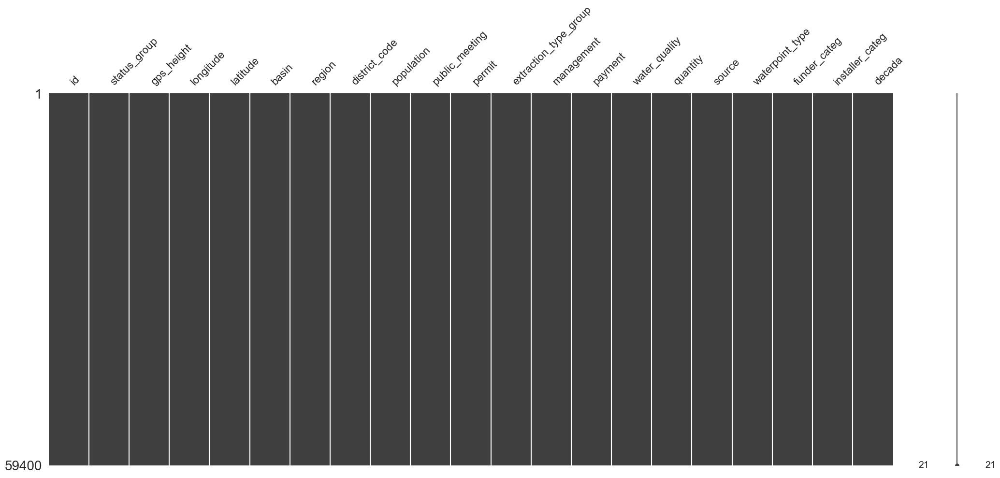

In [99]:
# Coexistencia y patrones de missings

import missingno as msno   

# Plot correlation heatmap of missingness
msno.matrix(df.sort_values(by='status_group'))
plt.show()

No se intuyen patrones de aparición de missings con facilidad. Hemos comprobado que no hay incidencia de valores perdidos (no hay lineas blancas entre las barras oscuras).

### PASO 3.2 TARGET

In [100]:
# Revisamos las etiquetas de la target
df['status_group'].value_counts()

functional                 32259
non functional             22824
functional needs repair     4317
Name: status_group, dtype: int64

In [101]:
# La target no esta balanceada. Vamos a codificarla
status_group_cod = {'functional':0,'non functional': 2,'functional needs repair': 1}
df['status_group'] = df['status_group'].replace(status_group_cod)

In [102]:
df['status_group'].value_counts()

0    32259
2    22824
1     4317
Name: status_group, dtype: int64

# PASO 4: GUARDAR DATASET DEPURADO

In [103]:
df.to_csv('df_train_limpio.csv')

# PASO 5: CON DATOS LIMPIOS, TRANSFORMAR TODAS LAS VARIABLES A NUMERICAS

In [104]:
# Lectura de datos
df =pd.read_csv('df_train_limpio.csv')
df.head()

,Unnamed: 0,id,status_group,gps_height,longitude,latitude,basin,region,district_code,population,...,extraction_type_group,management,payment,water_quality,quantity,source,waterpoint_type,funder_categ,installer_categ,decada
0,0,69572,0,1390,34.938093,-9.856322,Lake Nyasa,Iringa,5,109,...,gravity,vwc,pay annually,soft,enough,spring,communal standpipe,21,21,90s
1,1,8776,0,1399,34.698766,-2.147466,Lake Victoria,Mara,2,280,...,gravity,wug,never pay,soft,insufficient,rainwater harvesting,communal standpipe,21,21,10s
2,2,34310,0,686,37.460664,-3.821329,Pangani,Manyara,4,250,...,gravity,vwc,pay per bucket,soft,enough,dam,communal standpipe multiple,21,12,00s
3,3,67743,2,263,38.486161,-11.155298,Ruvuma / Southern Coast,Mtwara,63,58,...,submersible,vwc,never pay,soft,dry,machine dbh,communal standpipe multiple,9,20,80s
4,4,19728,0,0,31.130847,-1.825359,Lake Victoria,Kagera,1,281,...,gravity,other,never pay,soft,seasonal,rainwater harvesting,communal standpipe,21,21,90s


In [105]:
df.drop(columns=['Unnamed: 0'],inplace=True )

In [106]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 59400 entries, 0 to 59399
Data columns (total 21 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   id                     59400 non-null  int64  
 1   status_group           59400 non-null  int64  
 2   gps_height             59400 non-null  int64  
 3   longitude              59400 non-null  float64
 4   latitude               59400 non-null  float64
 5   basin                  59400 non-null  object 
 6   region                 59400 non-null  object 
 7   district_code          59400 non-null  int64  
 8   population             59400 non-null  int64  
 9   public_meeting         59400 non-null  bool   
 10  permit                 59400 non-null  bool   
 11  extraction_type_group  59400 non-null  object 
 12  management             59400 non-null  object 
 13  payment                59400 non-null  object 
 14  water_quality          59400 non-null  object 
 15  qu

Tranformaremos a numericas las variables que aparecen como *object, category y bool*.

In [107]:
## También a numéricas

df.basin.replace(('Lake Victoria','Pangani','Rufiji','Internal','Lake Tanganyika','Wami / Ruvu','Lake Nyasa',
                 'Ruvuma / Southern Coast','Lake Rukwa'),
                (1,2,3,4,5,6,7,8,9),inplace=True)

df.region.replace(('Iringa','Shinyanga','Mbeya','Kilimanjaro','Morogoro','Arusha','Kagera','Mwanza','Kigoma',
                  'Ruvuma','Pwani','Tanga','Dodoma','Singida','Mara','Tabora','Rukwa','Mtwara','Manyara',
                   'Lindi','Dar es Salaam'),
                  (1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21),inplace=True)

df.management.replace(('vwc','wug','water board','wua','private operator','parastatal','water authority',
                       'other','company','unknown','other - school','trust'),
                  (1,2,3,4,5,6,7,8,9,10,11,12),inplace=True)

df.decada.replace(('60s','70s','80s','90s','00s','10s'),
                  (1,2,3,4,5,6),inplace=True)

df.extraction_type_group.replace(('gravity','nira/tanira','other','submersible','swn 80','mono','india mark ii',
                                  'afridev','rope pump','other handpump','other motorpump','wind-powered','india mark iii'),
                  (1,2,3,4,5,6,7,8,9,10,11,12,13),inplace=True)

df.payment.replace(('never pay','pay per bucket','pay monthly','unknown','pay when scheme fails','pay annually','other'),
                  (1,2,3,4,5,6,7),inplace=True)

df.water_quality.replace(('soft','salty','unknown','milky','coloured','salty abandoned','fluoride','fluoride abandoned'),
                  (1,2,3,4,5,6,7,8),inplace=True)

df.quantity.replace(('enough','insufficient','dry','seasonal','unknown'),
                  (1,2,3,4,5),inplace=True)

df.source.replace(('spring','shallow well','machine dbh','river','rainwater harvesting','hand dtw','lake',
                   'dam','other','unknown'),
                (1,2,3,4,5,6,7,8,9,10),inplace=True)

df.waterpoint_type.replace(('communal standpipe','hand pump','other','communal standpipe multiple','improved spring',
                            'cattle trough','dam'),
                  (1,2,3,4,5,6,7),inplace=True)

df.public_meeting.replace(('True','False'),
                  (0,1),inplace=True)

df.permit.replace(('True','False'),
                  (0,1),inplace=True)

In [108]:
df.head()

,id,status_group,gps_height,longitude,latitude,basin,region,district_code,population,public_meeting,...,extraction_type_group,management,payment,water_quality,quantity,source,waterpoint_type,funder_categ,installer_categ,decada
0,69572,0,1390,34.938093,-9.856322,7,1,5,109,True,...,1,1,6,1,1,1,1,21,21,4
1,8776,0,1399,34.698766,-2.147466,1,15,2,280,True,...,1,2,1,1,2,5,1,21,21,6
2,34310,0,686,37.460664,-3.821329,2,19,4,250,True,...,1,1,2,1,1,8,4,21,12,5
3,67743,2,263,38.486161,-11.155298,8,18,63,58,True,...,4,1,1,1,3,3,4,9,20,3
4,19728,0,0,31.130847,-1.825359,1,7,1,281,True,...,1,8,1,1,4,5,1,21,21,4


In [109]:
# Comprobar que todas estan en numerica
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 59400 entries, 0 to 59399
Data columns (total 21 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   id                     59400 non-null  int64  
 1   status_group           59400 non-null  int64  
 2   gps_height             59400 non-null  int64  
 3   longitude              59400 non-null  float64
 4   latitude               59400 non-null  float64
 5   basin                  59400 non-null  int64  
 6   region                 59400 non-null  int64  
 7   district_code          59400 non-null  int64  
 8   population             59400 non-null  int64  
 9   public_meeting         59400 non-null  bool   
 10  permit                 59400 non-null  bool   
 11  extraction_type_group  59400 non-null  int64  
 12  management             59400 non-null  int64  
 13  payment                59400 non-null  int64  
 14  water_quality          59400 non-null  int64  
 15  qu

In [110]:
# Aun no estan todas a numerica.
# Pasar las variables de tipo bool a numerica
df.public_meeting = df.public_meeting.astype(int)
df.permit = df.permit.astype(int)

In [111]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 59400 entries, 0 to 59399
Data columns (total 21 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   id                     59400 non-null  int64  
 1   status_group           59400 non-null  int64  
 2   gps_height             59400 non-null  int64  
 3   longitude              59400 non-null  float64
 4   latitude               59400 non-null  float64
 5   basin                  59400 non-null  int64  
 6   region                 59400 non-null  int64  
 7   district_code          59400 non-null  int64  
 8   population             59400 non-null  int64  
 9   public_meeting         59400 non-null  int32  
 10  permit                 59400 non-null  int32  
 11  extraction_type_group  59400 non-null  int64  
 12  management             59400 non-null  int64  
 13  payment                59400 non-null  int64  
 14  water_quality          59400 non-null  int64  
 15  qu

In [112]:
# Todas ya son numericas

# Eliminar la variable 'id'
df.drop(columns=['id'],inplace=True )

In [113]:
# Para sacar la correlacion
corr = abs(df.corr())
corr[['status_group']].sort_values(by = 'status_group',ascending = False).style.background_gradient()

,status_group
status_group,1.000000
quantity,0.265164
decada,0.227242
waterpoint_type,0.214733
region,0.157607
payment,0.120134
gps_height,0.114029
funder_categ,0.105777
water_quality,0.082789
extraction_type_group,0.082571


Las variables más importantes del modelo son: *quantity, decada, waterpoint_type, region, payment, gps_height,funder_categ*


Con la funcion de **proporciones_final** vamos ver **como se relaciona cada una de las variables con la target**:

In [114]:
def proporciones_final (var,target,df):

    proporcion = pd.DataFrame()
    
    proporcion['%fugas'] = df[target].groupby(df[var]).mean()*100
    proporcion['Conteo'] = df[target].groupby(df[var]).count()
    proporcion= proporcion.round(3)   
    proporcion_filtered = proporcion[(proporcion['%fugas']>0) & (proporcion['Conteo']>10)]  
        
    if len(proporcion_filtered)<100 and len(proporcion_filtered)>1:
        fig = plt.figure()
        ax = proporcion_filtered['Conteo'].plot(kind='bar',grid=True)
                
        ax2 = ax.twinx()
        ax2.plot(proporcion_filtered['%fugas'].values, linestyle='-', linewidth=2.0,color='g')
        plt.ylim(0, 100) # modificación.
        plt.tight_layout()   
        
    else:        
        proporcion_filtered.reset_index(inplace=True)
        sns.lmplot(x = var,y ='%fugas', data=proporcion_filtered,fit_reg=True,ci=None)

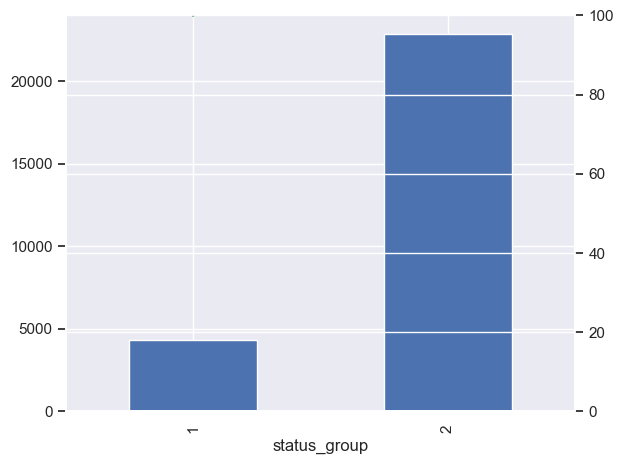

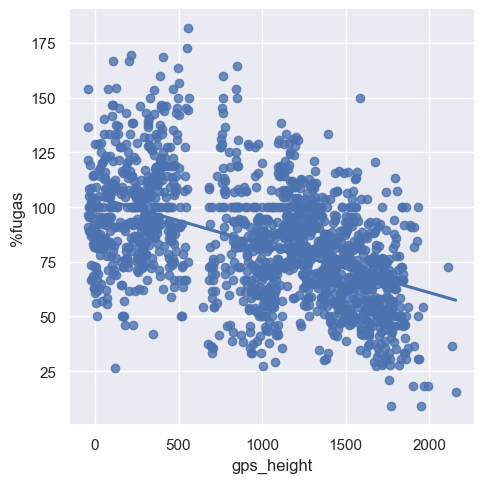

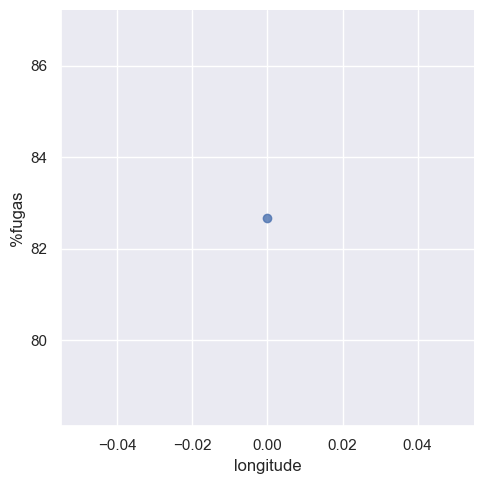

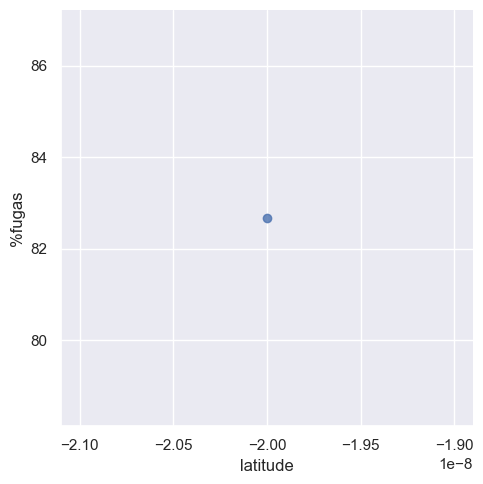

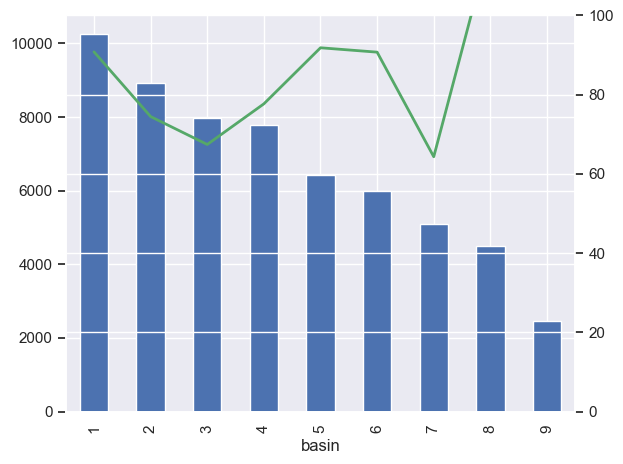

...

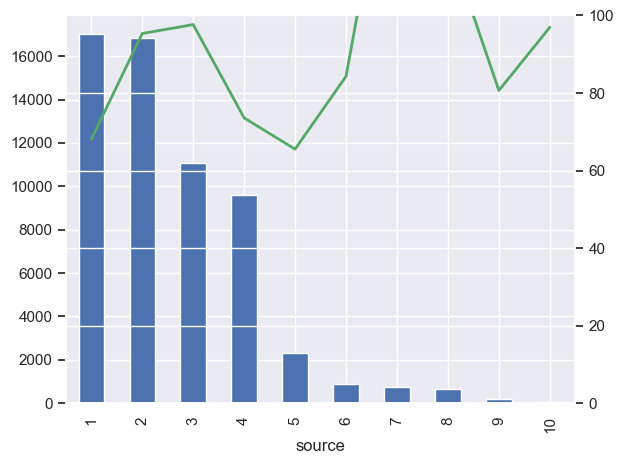

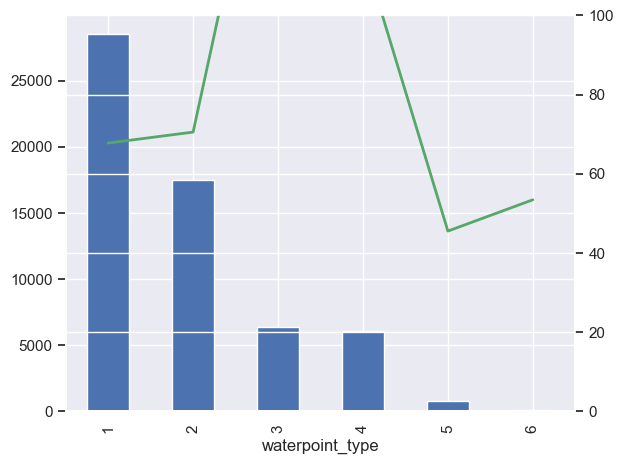

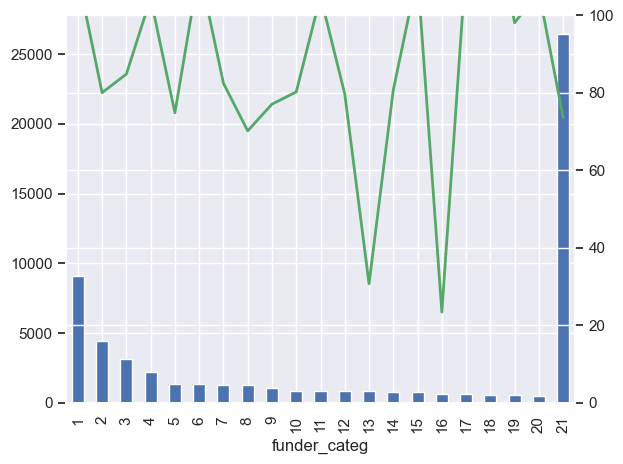

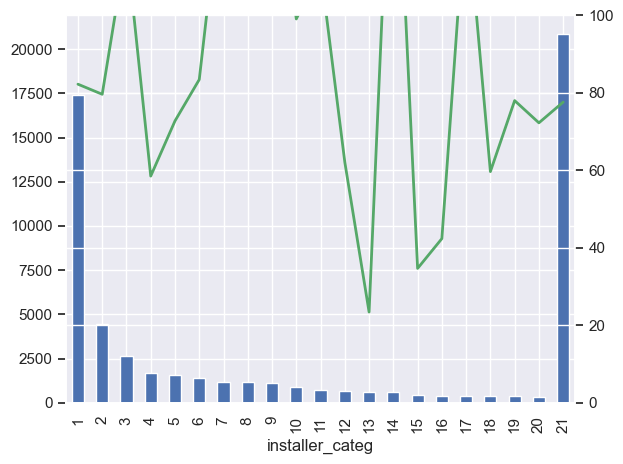

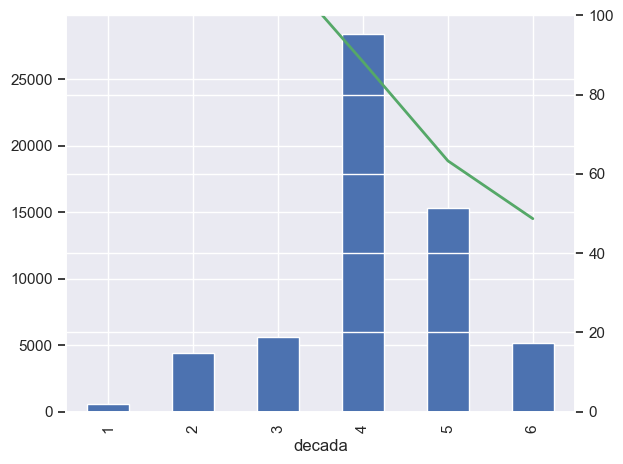

In [115]:
for i in df.columns:
    proporciones_final (i, 'status_group', df)

Lo **azul** es como se distribuye cada una de las variables. Lo **verde** es como se distribuye la target. 

- Variables *basin, region, district_code, extraction_type_group, management, payment, water_quality, quantity, source, waterpoint_type, decada*: la distribucion es normal. La target a partir de cierta cantidad, se sale de la gráfica, puede deberse a que la target no es una binaria. 

# PASO 6: CARGA, LIMPIEZA Y PREPARACION DE LOS DATOS DE TEST (test_set_values.csv)

## PASO 6.1: Carga de datos TEST

In [116]:
# Lectura de datos
df_test_set=pd.read_csv("test_set_values.csv")

df_test_set.head()

,id,amount_tsh,date_recorded,funder,gps_height,installer,longitude,latitude,wpt_name,num_private,...,payment_type,water_quality,quality_group,quantity,quantity_group,source,source_type,source_class,waterpoint_type,waterpoint_type_group
0,50785,0.0,2013-02-04,Dmdd,1996,DMDD,35.290799,-4.059696,Dinamu Secondary School,0,...,never pay,soft,good,seasonal,seasonal,rainwater harvesting,rainwater harvesting,surface,other,other
1,51630,0.0,2013-02-04,Government Of Tanzania,1569,DWE,36.656709,-3.309214,Kimnyak,0,...,never pay,soft,good,insufficient,insufficient,spring,spring,groundwater,communal standpipe,communal standpipe
2,17168,0.0,2013-02-01,NaN,1567,NaN,34.767863,-5.004344,Puma Secondary,0,...,never pay,soft,good,insufficient,insufficient,rainwater harvesting,rainwater harvesting,surface,other,other
3,45559,0.0,2013-01-22,Finn Water,267,FINN WATER,38.058046,-9.418672,Kwa Mzee Pange,0,...,unknown,soft,good,dry,dry,shallow well,shallow well,groundwater,other,other
4,49871,500.0,2013-03-27,Bruder,1260,BRUDER,35.006123,-10.950412,Kwa Mzee Turuka,0,...,monthly,soft,good,enough,enough,spring,spring,groundwater,communal standpipe,communal standpipe


## PASO 6.2: Vista preliminar de los datos TEST

In [117]:
# Mostrar informacion relativa de cada variable
df_test_set.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 14850 entries, 0 to 14849
Data columns (total 40 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   id                     14850 non-null  int64  
 1   amount_tsh             14850 non-null  float64
 2   date_recorded          14850 non-null  object 
 3   funder                 13981 non-null  object 
 4   gps_height             14850 non-null  int64  
 5   installer              13973 non-null  object 
 6   longitude              14850 non-null  float64
 7   latitude               14850 non-null  float64
 8   wpt_name               14850 non-null  object 
 9   num_private            14850 non-null  int64  
 10  basin                  14850 non-null  object 
 11  subvillage             14751 non-null  object 
 12  region                 14850 non-null  object 
 13  region_code            14850 non-null  int64  
 14  district_code          14850 non-null  int64  
 15  lg

- Valores no nulos son 14850, es el conjunto total de datos
- Las variables de tipo *object* quiere decir que son de tipo string (texto) y por tanto variables de tipo categorica. 
- Hay **variables con nulos**, como: *funder, installer, subvillage, public_meeting, scheme_management, scheme_name, permit*. Más adelante, tendremos que gestionar esos valores nulos, en aquellas variables que nos interesen mantener para nuestro modelo.

In [118]:
# Visualizar el porcentaje de valores faltantes para cada variable,  usando el método isnull() más el método mean()
df_test_set.isnull().mean()

id                       0.000000
amount_tsh               0.000000
date_recorded            0.000000
funder                   0.058519
gps_height               0.000000
installer                0.059057
longitude                0.000000
latitude                 0.000000
wpt_name                 0.000000
num_private              0.000000
basin                    0.000000
subvillage               0.006667
region                   0.000000
region_code              0.000000
district_code            0.000000
lga                      0.000000
ward                     0.000000
population               0.000000
public_meeting           0.055286
recorded_by              0.000000
scheme_management        0.065253
scheme_name              0.477576
permit                   0.049630
construction_year        0.000000
extraction_type          0.000000
extraction_type_group    0.000000
extraction_type_class    0.000000
management               0.000000
management_group         0.000000
payment       

In [119]:
# Analisis estadistico, de las variables numericas
df_test_set.describe()

,id,amount_tsh,gps_height,longitude,latitude,num_private,region_code,district_code,population,construction_year
count,14850.000000,14850.000000,14850.000000,14850.000000,1.485000e+04,14850.000000,14850.000000,14850.000000,14850.000000,14850.000000
mean,37161.972929,322.826983,655.147609,34.061605,-5.684724e+00,0.415084,15.139057,5.626397,184.114209,1289.708350
std,21359.364833,2510.968644,691.261185,6.593034,2.940803e+00,8.167910,17.191329,9.673842,469.499332,955.241087
min,10.000000,0.000000,-57.000000,0.000000,-1.156459e+01,0.000000,1.000000,0.000000,0.000000,0.000000
25%,18727.000000,0.000000,0.000000,33.069455,-8.443970e+00,0.000000,5.000000,2.000000,0.000000,0.000000
50%,37361.500000,0.000000,344.000000,34.901215,-5.049750e+00,0.000000,12.000000,3.000000,20.000000,1986.000000
75%,55799.750000,25.000000,1308.000000,37.196594,-3.320594e+00,0.000000,17.000000,5.000000,220.000000,2004.000000
max,74249.000000,200000.000000,2777.000000,40.325016,-2.000000e-08,669.000000,99.000000,80.000000,11469.000000,2013.000000


## PASO 6.3: Analisis de variables y limpieza de los datos TEST

Se va realizar el mismo analisis y limpieza de datos, que ya se realizo con los datos de train

In [120]:
# Codificador de etiquetas
le = LabelEncoder()

- Variable **amount_tsh (NUMERICA)**, la cantidad de agua disponible para el punto de agua:

In [121]:
df_test_set['amount_tsh'].value_counts()

0.0         10410
500.0         772
50.0          631
1000.0        370
20.0          349
            ...  
14000.0         1
0.2             1
70000.0         1
100000.0        1
2800.0          1
Name: amount_tsh, Length: 68, dtype: int64

In [122]:
# Vemos muchos 0 , siendo el total de los datos de esta variable 14.850 obervaciones.
# Vamos a cuantificar que propocion de 0 hay dentro de esta variable:
df_test_set['amount_tsh'].value_counts()/df_test_set['amount_tsh'].count()

0.0         0.701010
500.0       0.051987
50.0        0.042492
1000.0      0.024916
20.0        0.023502
              ...   
14000.0     0.000067
0.2         0.000067
70000.0     0.000067
100000.0    0.000067
2800.0      0.000067
Name: amount_tsh, Length: 68, dtype: float64

El 70% de los datos de esta variable son 0, por lo que dicha variable NO nos va aportar apenas informacion relevante para nuestro modelo de prediccion. **Eliminaremos la variable *amount_tsh*.**


- Variable **date_recorded (NO NUMERICA)**: 

Se trata de una variable que indica la fecha que se ingresaron los datos de esa fila. Esta variable no aporta informacion relevante a nuestro modelo. **Eliminaremos la variable *date_recorded*.**


- Variable **funder (NO NUMERICA)**:

Esta variable indica quien financio el pozo. Anteriormente vimos que un 5.8% de sus valores son nulos, dado que es un % bajo, vamos a transformar esos valores nulos, en Unknown (desconocidos).

In [123]:
df_test_set['funder'].fillna(value='Unknown',inplace=True)  # para los valores NaN
df_test_set['funder'].replace(to_replace = '0', value ='Unknown' , inplace=True) # para los valores 0

In [124]:
df_test_set['funder'].nunique()

979

In [125]:
# Son muchas etiquetas para una variable. 
# La variable 'funder' es object, habria que pasarla a numerica
# Para reducir el nº de etiquetas vamos reducirlo a 20 etiquetas (las mas repetidas) y luego codificarlas

df_test_set['funder'].value_counts().head(20)

Government Of Tanzania    2215
Unknown                   1073
Danida                     793
Hesawa                     580
World Bank                 352
Kkkt                       336
Rwssp                      329
World Vision               316
Unicef                     267
Tasaf                      259
Dhv                        236
Private Individual         208
Dwsp                       201
District Council           194
Norad                      184
Water                      156
Germany Republi            155
Ministry Of Water          138
Tcrs                       133
Hifab                      127
Name: funder, dtype: int64

In [126]:
df1 = df_test_set.loc[df_test_set['funder']== 'Government Of Tanzania']
df2 = df_test_set.loc[df_test_set['funder']== 'Unknown']              
df3 = df_test_set.loc[df_test_set['funder']== 'Danida'] 
df4 = df_test_set.loc[df_test_set['funder']== 'Hesawa'] 
df5 = df_test_set.loc[df_test_set['funder']== 'World Bank'] 
df6 = df_test_set.loc[df_test_set['funder']== 'Kkkt'] 
df7 = df_test_set.loc[df_test_set['funder']== 'Rwssp'] 
df8 = df_test_set.loc[df_test_set['funder']== 'World Vision']
df9 = df_test_set.loc[df_test_set['funder']== 'Unicef'] 
df10 = df_test_set.loc[df_test_set['funder']== 'Tasaf'] 
df11 = df_test_set.loc[df_test_set['funder']== 'Dhv'] 
df12 = df_test_set.loc[df_test_set['funder']== 'Private Individual'] 
df13 = df_test_set.loc[df_test_set['funder']== 'Dwsp'] 
df14 = df_test_set.loc[df_test_set['funder']== 'District Council'] 
df15 = df_test_set.loc[df_test_set['funder']== 'Norad'] 
df16 = df_test_set.loc[df_test_set['funder']== 'Water']
df17 = df_test_set.loc[df_test_set['funder']== 'Germany Republi']
df18 = df_test_set.loc[df_test_set['funder']== 'Ministry Of Water']
df19 = df_test_set.loc[df_test_set['funder']== 'Tcrs']
df20 = df_test_set.loc[df_test_set['funder']== 'Hifab']

df_test_set_funder = pd.concat([df1,df2,df3,df4,df5,df6,df7,df8,df9,df10,df11,df12,
                       df13,df14,df15,df16,df17,df18,df19,df20], ignore_index=True)

In [127]:
# Para guardar la columna 'funder_categ' en el dataframe
df_test_set['funder_categ'] = df_test_set['funder']

# 
colum_funder = ['Government Of Tanzania','Unknown','Danida','Hesawa','World Bank', 'Kkkt','Rwssp','World Vision',
                'Unicef','Tasaf','Dhv','Private Individual','Dwsp','District Council','Norad','Water','Germany Republi',
                'Ministry Of Water', 'Tcrs', 'Hifab']
    
    
df_test_set.loc[~df_test_set["funder_categ"].isin(colum_funder), "funder_categ"] = "Others"

In [128]:
# Comprobar que tenemos unicamente 21 etiquetas
df_test_set['funder_categ'].nunique()

21

In [129]:
df_test_set.funder_categ.replace(('Government Of Tanzania','Unknown','Danida','Hesawa','World Bank', 'Kkkt','Rwssp','World Vision',
                'Unicef','Tasaf','Dhv','Private Individual','Dwsp','District Council','Norad','Water','Germany Republi',
                'Ministry Of Water', 'Tcrs', 'Hifab','Others'),
                        (1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21),inplace=True)

In [130]:
# Eliminaremos 'funder', para quedarnos con 'funder_categ' que es numerica y ya esta codificada.

- Variable **gps_height**:

Esta variable indica la altitud a la que se encuenta el pozo, es decir, el nivel del mar al que se encuentra.

In [131]:
df_test_set['gps_height'].value_counts()

 0       5211
 1294      18
-19        18
 1343      18
 1283      17
         ... 
 1960       1
 2104       1
 1885       1
 1634       1
 640        1
Name: gps_height, Length: 2157, dtype: int64

In [132]:
# Vemos muchos 0 , siendo el total de los datos de esta variable que son 14850.
# Vamos a cuantificar que propocion de 0 hay dentro de esta variable:
df_test_set['gps_height'].value_counts()/df_test_set['gps_height'].count()

 0       0.350909
 1294    0.001212
-19      0.001212
 1343    0.001212
 1283    0.001145
           ...   
 1960    0.000067
 2104    0.000067
 1885    0.000067
 1634    0.000067
 640     0.000067
Name: gps_height, Length: 2157, dtype: float64

Tal y como vimos en la depuracion de los datos en train, esta variable nos aporta informacion relevante de los puntos de agua en funcion de la distancia al nivel del mar. Respecto a los 0 (representan un 35,09% del total de los datos de esta variable), posiblemente signifiquen que los pozos se encuentran al nivel del mar, por lo que vamos a mantener esta varaible como viene originalmente.


- Variable **installer (NO NUMERICA)**:

Esta variable indica la organizacion de instalo el pozo. Anteriormente, vimos que tiene un 5.9% de valores nulos. Dado que es un % bajo, vamos a transformar esos valores nulos, en unknown (desconocidos).

In [133]:
df_test_set['installer'].fillna(value='Unknown',inplace=True) # para los valores NaN
df_test_set['installer'].replace(to_replace = '0', value ='Unknown' , inplace=True) # para los valores 0

In [134]:
df_test_set['installer'].nunique()

1090

In [135]:
# Son muchas etiquetas para una variable. 
# La variable 'installer' es object, habria que pasarla a numerica
# Para reducir el nº de etiquetas vamos reducirlo a 20 etiquetas (las mas repetidas) y luego codificarlas

df_test_set['installer'].value_counts().head(20)

DWE                   4349
Unknown               1081
Government             457
RWE                    292
Commu                  287
DANIDA                 255
Hesawa                 230
KKKT                   222
TCRS                   180
CES                    155
Central government     142
HESAWA                 140
DANID                  138
Community              134
District Council       112
World vision           109
TASAF                  108
Gover                  100
WEDECO                  99
District council        98
Name: installer, dtype: int64

Vemos que *District Council* y *District council* , son lo mismo pero diferente forma de escribirlo lo considera como dos etiquetas diferentes. Tambien vemos que *Central government* y *Government* hacen referencia al Gobierno de Tanzania, por lo que se deberia tratar de la misma etiqueta. 

Vamos a juntar en una sola etiqueta aquellas etiquetas similares:

In [136]:
df_test_set['installer'].replace(to_replace = ('District Water Department', 'District water depar','Distric Water Department'),
                        value ='District water department' , inplace=True)

df_test_set['installer'].replace(to_replace = ('FinW','Fini water','FINI WATER'), value ='Fini Water' , inplace=True)
df_test_set['installer'].replace(to_replace = 'JAICA', value ='Jaica' , inplace=True)

df_test_set['installer'].replace(to_replace = ('COUN', 'District COUNCIL', 'DISTRICT COUNCIL','District Counci', 
                                      'District Council','Council','Counc','District  Council','Distri'),
                                    value ='District council' , inplace=True)

df_test_set['installer'].replace(to_replace = ('RC CHURCH', 'RC Churc', 'RC','RC Ch','RC C', 'RC CH','RC church', 
                                      'RC CATHORIC',) , value ='RC Church' , inplace=True)

df_test_set['installer'].replace(to_replace = ('Central Government','Tanzania Government',
                                       'central government','Cental Government', 'Cebtral Government', 
                                      'Tanzanian Government','Tanzania government', 'Centra Government' ,
                                      'CENTRAL GOVERNMENT', 'TANZANIAN GOVERNMENT','Central govt', 'Centr', 
                                      'Centra govt') , value ='Central government' , inplace=True)

df_test_set['installer'].replace(to_replace = ('World vision', 'World Division','World Vision'),
                                        value ='world vision' , inplace=True)

df_test_set['installer'].replace(to_replace = ('Unisef','UNICEF'),value ='Unicef' , inplace=True)
df_test_set['installer'].replace(to_replace = 'DANID', value ='DANIDA' , inplace=True)

df_test_set['installer'].replace(to_replace = ('villigers', 'villager', 'Villagers', 'Villa', 'Village', 'Villi', 
                                      'Village Council','Village Counil', 'Villages', 'Vill', 'Village community', 
                                      'Villaers', 'Village Community', 'Villag','Villege Council', 'Village council',
                                      'Village  Council','Villagerd', 'Villager', 'Village Technician',
                                      'Village Office','Village community members'),
                                        value ='villagers' , inplace=True)

df_test_set['installer'].replace(to_replace =('Commu','Communit','commu','COMMU', 'COMMUNITY') ,
                                        value ='Community' , inplace=True)

df_test_set['installer'].replace(to_replace = ('GOVERNMENT', 'GOVER', 'GOVERNME', 'GOVERM','GOVERN','Gover','Gove',
                                      'Governme','Governmen' ) ,value ='Government' , inplace=True)

df_test_set['installer'].replace(to_replace = 'Hesawa' ,value ='HESAWA' , inplace=True)

df_test_set['installer'].replace(to_replace = ('Colonial Government') , value ='Colonial government' , inplace=True)
df_test_set['installer'].replace(to_replace = ('Government of Misri') , value ='Misri Government' , inplace=True)
df_test_set['installer'].replace(to_replace = ('Italy government') , value ='Italian government' , inplace=True)
df_test_set['installer'].replace(to_replace = ('British colonial government') , value ='British government' , inplace=True)
df_test_set['installer'].replace(to_replace = ('Concern /government') , value ='Concern/Government' , inplace=True)
df_test_set['installer'].replace(to_replace = ('Village Government') , value ='Village government' , inplace=True)
df_test_set['installer'].replace(to_replace = ('Government and Community') , value ='Government /Community' , inplace=True)
df_test_set['installer'].replace(to_replace = ('Cetral government /RC') , value ='RC church/Central Gover' , inplace=True)
df_test_set['installer'].replace(to_replace = ('Government /TCRS','Government/TCRS') , value ='TCRS /Government' , inplace=True)
df_test_set['installer'].replace(to_replace = ('ADRA /Government') , value ='ADRA/Government' , inplace=True)

In [137]:
df_test_set['installer'].nunique()

1036

In [138]:
df_test_set['installer'].value_counts().head(20)

DWE                   4349
Unknown               1081
Government             677
Community              438
DANIDA                 393
HESAWA                 370
RWE                    292
District council       270
Central government     245
KKKT                   222
TCRS                   180
world vision           165
CES                    155
Fini Water             139
RC Church              125
TASAF                  108
villagers              106
WEDECO                  99
LGA                     93
Unicef                  89
Name: installer, dtype: int64

In [139]:
df_1 = df_test_set.loc[df_test_set['installer']== 'DWE']
df_2 = df_test_set.loc[df_test_set['installer']== 'Unknown']              
df_3 = df_test_set.loc[df_test_set['installer']== 'Government'] 
df_4 = df_test_set.loc[df_test_set['installer']== 'Community'] 
df_5 = df_test_set.loc[df_test_set['installer']== 'DANIDA'] 
df_6 = df_test_set.loc[df_test_set['installer']== 'HESAWA'] 
df_7 = df_test_set.loc[df_test_set['installer']== 'RWE'] 
df_8 = df_test_set.loc[df_test_set['installer']== 'District council']
df_9 = df_test_set.loc[df_test_set['installer']== 'Central government']
df_10 = df_test_set.loc[df_test_set['installer']== 'KKKT'] 
df_11 = df_test_set.loc[df_test_set['installer']== 'TCRS'] 
df_12 = df_test_set.loc[df_test_set['installer']== 'world vision'] 
df_13 = df_test_set.loc[df_test_set['installer']== 'CES'] 
df_14 = df_test_set.loc[df_test_set['installer']== 'Fini Water'] 
df_15 = df_test_set.loc[df_test_set['installer']== 'RC Church']
df_16 = df_test_set.loc[df_test_set['installer']== 'TASAF']
df_17 = df_test_set.loc[df_test_set['installer']== 'villagers']
df_18 = df_test_set.loc[df_test_set['installer']== 'WEDECO']
df_19 = df_test_set.loc[df_test_set['installer']== 'LGA']
df_20 = df_test_set.loc[df_test_set['installer']== 'Unicef']



df_test_set_installer = pd.concat([df_1,df_2,df_3,df_4,df_5,df_6,df_7,df_8,df_9,df_10,df_11,df_12,
                          df13,df14,df15,df16,df17,df18,df19,df20], ignore_index=True)

In [140]:
# Para generar la columna 'installer_categ' en el dataframe
df_test_set['installer_categ'] = df_test_set['installer']

#
colum_installer = ['DWE','Unknown','Government','Community','DANIDA','HESAWA','RWE','District council', 
                   'Central government','KKKT','TCRS', 'world vision','CES','Fini Water', 'RC Church',
                   'TASAF','villagers','WEDECO','LGA','Unicef']
    
    
df_test_set.loc[~df_test_set['installer_categ'].isin(colum_installer), 'installer_categ'] = 'Others'

In [141]:
# Comprobar que tenemos unicamente 21 etiquetas
df_test_set['installer_categ'].nunique()

21

In [142]:
df_test_set.installer_categ.replace(('DWE','Unknown','Government','Community','DANIDA','HESAWA','RWE','District council', 
                   'Central government','KKKT','TCRS', 'world vision','CES','Fini Water', 'RC Church',
                   'TASAF','villagers','WEDECO','LGA','Unicef','Others'),
                        (1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21),inplace=True)

In [143]:
# Eliminaremos 'installer', para quedarnos con 'installer_categ' que es numerica y ya esta codificada.

- Variable **longitude y latitude (NUMERICA)**:

Estas varaibles indican las coordenada GPS. Vamos a mantener esta varaible como viene originalmente.

- Variable **wpt_name (NO NUMERICA)**:

Se trata de una varaible que indica el nombre del punto de agua si lo hay. Esta variable no aporta informacion relevante a nuestro modelo. **Eliminaremos la variable *wpt_name*.**


- Variable **num_private (NUMERICA)**:

Mas de las mitad de sus datos son 0. Esta variable no aporta informacion relevante a nuestro modelo. **Eliminaremos la variable *num_private*.**

In [144]:
df_test_set['num_private'].value_counts().head()

0     14656
1        21
5        14
15       12
8        12
Name: num_private, dtype: int64

In [145]:
# Vemos muchos 0 , siendo el total de los datos de esta variable.
# Vamos a cuantificar que propocion de 0 hay dentro de esta variable:
df_test_set['num_private'].value_counts()/df_test_set['num_private'].count()

0      0.986936
1      0.001414
5      0.000943
15     0.000808
8      0.000808
3      0.000741
6      0.000741
4      0.000673
93     0.000606
2      0.000539
102    0.000539
11     0.000471
17     0.000471
47     0.000404
7      0.000337
16     0.000337
22     0.000337
45     0.000337
32     0.000337
65     0.000337
39     0.000269
34     0.000202
41     0.000135
80     0.000135
180    0.000135
50     0.000135
120    0.000135
12     0.000135
25     0.000135
10     0.000067
26     0.000067
13     0.000067
23     0.000067
669    0.000067
420    0.000067
141    0.000067
Name: num_private, dtype: float64

El 98,69% de los datos de esta variable son 0. Es decir, mas de las mitad de sus datos son 0. Esta variable no aporta informacion relevante a nuestro modelo. **Eliminaremos la variable *num_private*.**


- Variable **basin (NO NUMERICA)**:

Se trata de una varaible que indica la cuenca hidrográfica geográfica. 

In [146]:
df_test_set['basin'].value_counts()

Lake Victoria              2623
Pangani                    2203
Rufiji                     2011
Internal                   1857
Lake Tanganyika            1620
Wami / Ruvu                1590
Lake Nyasa                 1247
Ruvuma / Southern Coast    1094
Lake Rukwa                  605
Name: basin, dtype: int64

Vamos a mantener esta varaible viene originalmente. Queda pasarla a numerica.

- Variables **subvillage (NO NUMERICA), region (NO NUMERICA), region_code (NUMERICA), district_code (NUMERICA), lga (NO NUMERICA), ward (NO NUMERICA)**:

Estas variables nos indican la ubicación geográfica del pozo. 

In [147]:
df_test_set['subvillage'].value_counts()

Shuleni           140
Majengo           129
Madukani          121
Kati               94
Sokoni             62
                 ... 
Kurukangara         1
Kiranjeranje A      1
Mwajiji             1
Ngabobo             1
Kamba               1
Name: subvillage, Length: 8443, dtype: int64

In [148]:
df_test_set['region'].value_counts()

Shinyanga        1311
Iringa           1305
Mbeya            1119
Kilimanjaro      1115
Morogoro         1032
Kagera            858
Mwanza            795
Arusha            761
Kigoma            717
Pwani             696
Ruvuma            666
Tanga             639
Dodoma            578
Tabora            507
Mara              482
Singida           443
Rukwa             434
Mtwara            414
Manyara           389
Lindi             374
Dar es Salaam     215
Name: region, dtype: int64

In [149]:
df_test_set['region_code'].value_counts()

17    1323
11    1308
12    1120
3     1115
5     1039
18     859
19     777
16     717
2      685
10     666
4      632
1      578
14     509
20     482
13     443
15     434
6      423
21     389
80     298
60     273
90     216
7      215
9      109
99      89
24      76
8       75
Name: region_code, dtype: int64

In [150]:
df_test_set['district_code'].value_counts()

1     3096
2     2756
3     2523
4     2254
5     1072
6     1034
7      823
30     261
8      239
33     189
53     176
43     148
13     105
63      69
23      67
62      18
60      13
0        4
67       2
80       1
Name: district_code, dtype: int64

In [151]:
df_test_set['lga'].value_counts()

Njombe          625
Moshi Rural     315
Bariadi         308
Rungwe          275
Kasulu          275
               ... 
Songea Urban     23
Tanga            22
Arusha Urban     19
Lindi Urban       3
Nyamagana         1
Name: lga, Length: 125, dtype: int64

In [152]:
df_test_set['ward'].value_counts()

Igosi        79
Imalinyi     66
Siha Kati    65
Mdandu       61
Kitunda      57
             ..
Manyondwe     1
Lizaboni      1
Masasi        1
Mtombozi      1
Idifu         1
Name: ward, Length: 1959, dtype: int64

In [153]:
df_test_set['subvillage'].nunique()

8443

In [154]:
df_test_set['region'].nunique()

21

In [155]:
df_test_set['region_code'].nunique()

26

In [156]:
df_test_set['district_code'].nunique()

20

In [157]:
df_test_set['ward'].nunique()

1959

In [158]:
df_test_set['lga'].nunique()

125

Da las 6 variables que indican la ubicación geográfica del pozo, y tras ver las etiquetas de cada una, siendo:
- subvillage -> 8443 , son demasiados por lo que descartamos esta variable.
- region -> 21
- region_code -> 26
- district_code -> 20
- ward -> 1959 , son demasiados por lo que descartamos esta variable.
- lga -> 125 , son demasiados por lo que descartamos esta variable.

Las variables *region* y *district_code* nos aporta mas informacion a nuestro modelo de prediccion, que la variable *region_code*. Por tanto, descartamos *region_code*.

**Eliminaremos las variables *subvillage, ward, lga, region_code*.**


- Variables **population (NUMERICA)**:

Esta variable indica la poblacion alrededor del pozo. 

In [159]:
df_test_set['population'].value_counts()

0       5453
1       1757
150      436
200      430
250      406
        ... 
745        1
4735       1
447        1
546        1
2960       1
Name: population, Length: 637, dtype: int64

In [160]:
# Vemos muchos 0 , siendo el total de los datos de esta variable 14850 obervaciones.
# Vamos a cuantificar que propocion de 0 hay dentro de esta variable:
df_test_set['population'].value_counts()/df_test_set['population'].count()

0       0.367205
1       0.118316
150     0.029360
200     0.028956
250     0.027340
          ...   
745     0.000067
4735    0.000067
447     0.000067
546     0.000067
2960    0.000067
Name: population, Length: 637, dtype: float64

In [161]:
# Un 36.72% de los datos son 0, podemos rellenarlos por la moda (el que mas veces repetido este) o bien por la media. 
df_test_set.loc[df_test_set['population']!=0].describe()

,id,amount_tsh,gps_height,longitude,latitude,num_private,region_code,district_code,population,construction_year,funder_categ,installer_categ
count,9397.000000,9397.000000,9397.000000,9397.000000,9397.000000,9397.000000,9397.000000,9397.000000,9397.000000,9397.000000,9397.000000,9397.000000
mean,37114.932532,447.764255,957.686815,36.095878,-6.145897,0.655954,15.853570,6.304246,290.954134,1963.989252,13.536661,11.279238
std,21407.044653,3089.832261,614.671104,2.590755,2.732964,10.260354,21.208985,11.423768,563.265359,255.485943,8.503791,8.980723
min,10.000000,0.000000,-57.000000,29.612776,-11.564592,0.000000,2.000000,1.000000,1.000000,0.000000,1.000000,1.000000
25%,18610.000000,0.000000,337.000000,34.714606,-8.313329,0.000000,4.000000,2.000000,40.000000,1987.000000,3.000000,1.000000
50%,37122.000000,0.000000,1125.000000,36.748375,-5.859215,0.000000,10.000000,3.000000,150.000000,2000.000000,21.000000,11.000000
75%,55805.000000,200.000000,1449.000000,37.971678,-3.613975,0.000000,16.000000,5.000000,350.000000,2008.000000,21.000000,21.000000
max,74249.000000,200000.000000,2777.000000,40.325016,-1.106080,669.000000,99.000000,67.000000,11469.000000,2013.000000,21.000000,21.000000


In [162]:
# Vamos a rellenar por la media que es 291
df_test_set['population'].replace(to_replace = 0 , value =291, inplace=True)

In [163]:
df_test_set['population'].value_counts()

291     5455
1       1757
150      436
200      430
250      406
        ... 
226        1
745        1
4735       1
1523       1
2960       1
Name: population, Length: 636, dtype: int64

- Variable **public_meeting (NO NUMERICA)**:

Esta variable vimos que tenia valores nulos (5,5%), al ser un % bajo, vamos a rellenarlos con los valores mas repetidos (por la moda).

In [164]:
df_test_set['public_meeting'].value_counts()

True     12738
False     1291
Name: public_meeting, dtype: int64

In [165]:
df_test_set['public_meeting'].fillna(value=True,inplace=True)

In [166]:
# Comprobar de que haya mas valores en TRUE
df_test_set['public_meeting'].value_counts()

True     13559
False     1291
Name: public_meeting, dtype: int64

- Variable **recorded_by (NO NUMERICA)**:

Esta variable indica el grupo ingreso las filas de datos.

In [167]:
df_test_set['recorded_by'].value_counts()

GeoData Consultants Ltd    14850
Name: recorded_by, dtype: int64

Unicamente tiene un valor, el cual no aporta informacion a nuestro modelo prediccion. **Eliminaremos la variable *recorded_by*.**

- Variables **scheme_management (NO NUMERICA), scheme_name (NO NUMERICA)** 

Estas variables indican quién opera el punto de agua. Anteriormente, ya vimos que *scheme_name* tiene el 47.75% de sus valores nulos y *scheme_management* un 6.5% valores nulos. 

In [168]:
df_test_set['scheme_management'].value_counts()

VWC                 9124
WUG                 1290
Water authority      822
Water Board          714
WUA                  668
Parastatal           444
Company              280
Private operator     263
Other                230
SWC                   26
Trust                 20
Name: scheme_management, dtype: int64

In [169]:
df_test_set['scheme_name'].value_counts()

K                      176
Borehole               158
None                   150
DANIDA                 104
Chalinze wate           96
                      ... 
Iseke water supply       1
Dina                     1
Water supplying          1
Mazi                     1
Mbwasa water supply      1
Name: scheme_name, Length: 1789, dtype: int64

- Variables **management (NO NUMERICA), management_group (NO NUMERICA)**:

Estas variables indican cómo se gestiona el punto de agua.

In [170]:
df_test_set['management'].value_counts()

vwc                 10117
wug                  1593
water board           755
wua                   583
private operator      533
parastatal            461
other                 239
water authority       219
company               174
unknown               122
other - school         27
trust                  27
Name: management, dtype: int64

In [171]:
df_test_set['management_group'].value_counts()

user-group    13048
commercial      953
parastatal      461
other           266
unknown         122
Name: management_group, dtype: int64

In [172]:
# El nombre de las etiquetas de 'management' y 'scheme_management', son muy similares. 
# Vamos a comprobar sus valores unicos
df_test_set['scheme_management'].nunique()

11

In [173]:
df_test_set['management'].nunique()

12

In [174]:
# Comprobar posibles subgrupos con las etiquetas similares
df_test_set.groupby(['management_group','management']).count() 

id  amount_tsh  date_recorded  funder  \
management_group management                                                   
commercial       company             174         174            174     174   
                 private operator    533         533            533     533   
                 trust                27          27             27      27   
                 water authority     219         219            219     219   
other            other               239         239            239     239   
                 other - school       27          27             27      27   
parastatal       parastatal          461         461            461     461   
unknown          unknown             122         122            122     122   
user-group       vwc               10117       10117          10117   10117   
                 water board         755         755            755     755   
                 wua                 583         583            583     583   
                 wug                1593        1593           1593    1593   

                                   gps_height  installer  longitude  latitude  \
management_group management                                                     
commercial       company                  174        174        174       174   
                 private operator         533        533        533       533   
                 trust                     27         27         27        27   
                 water authority          219        219        219       219   
other            other                    239        239        239       239   
                 other - school            27         27         27        27   
parastatal       parastatal               461        461        461       461   
unknown          unknown                  122        122        122       122   
user-group       vwc                    10117      10117      10117     10117   
                 water board              755        755        755       755   
                 wua                      583        583        583       583   
                 wug                     1593       1593       1593      1593   

                                   wpt_name  num_private  ...  quality_group  \
management_group management                               ...                  
commercial       company                174          174  ...            174   
                 private operator       533          533  ...            533   
                 trust                   27           27  ...             27   
                 water authority        219          219  ...            219   
other            other                  239          239  ...            239   
                 other - school          27           27  ...             27   
parastatal       parastatal             461          461  ...            461   
unknown          unknown                122          122  ...            122   
user-group       vwc                  10117        10117  ...          10117   
                 water board            755          755  ...            755   
                 wua                    583          583  ...            583   
                 wug                   1593         1593  ...           1593   

                                   quantity  quantity_group  source  \
management_group management                                           
commercial       company                174             174     174   
                 private operator       533             533     533   
                 trust                   27              27      27   
                 water authority        219             219     219   
other            other                  239             239     239   
                 other - school          27              27      27   
parastatal       parastatal             461             461     461   
unknown          unknown            

Como hemos visto, las etiquetas de la variable *management* son muy similares a las de *scheme_management*. Anteriormente, ya vimos que *scheme_management* tiene valores nulos, mientras que *management* no tiene valores nulos. Por tanto, preferimos quedarnos que la variable sin nulos y descartar la variable *scheme_management*.

Respecto a *scheme_name*, dado el alto % de valores nulos, su alta cardialidad y que la finalidad del modelo predicto es predecir la condición operativa de un pozo; se descarta esta variable.

Por otro lado, vemos que las etiquetas de *management* y *management_group* guardan relacion. Se puede intuir que entre estas dos variables exite etiquetas y valores iguales, que para el modelo supondria duplicidad de datos. Tras comprobar si se pueden hacer subgrupos con las etiquetas de ambos, observamos que las etiquetas *management* dan mas detalle de quien gestione el pozo. Por tanto, preferimos quedarnos que la variable que más informacion detalleda da que es *management* y descartar la variable *management_group*.


 **Eliminaremos las variables *scheme_management, scheme_name, management_group*.**
 

- Variable **permit (NO NUMERICA)**:

Esta variable indica si el punto de agua está permitido. Esta variable vimos que tenia valores nulos (4.9%), al ser un % bajo, vamos a rellenarlos con los valores mas repetidos (por la moda).

In [175]:
df_test_set['permit'].value_counts()

True     9754
False    4359
Name: permit, dtype: int64

In [176]:
# Con valores nulos, vamos a rellenarlos con los valores mas repetidos
df_test_set['permit'].fillna(value=True, inplace=True)

In [177]:
# Comprobacion de que haya mas valores en TRUE
df_test_set['permit'].value_counts()

True     10491
False     4359
Name: permit, dtype: int64

- Variable **construction_year (NUMERICA)**:

Esta variable indica el año de construcción del punto de agua

In [178]:
df_test_set['construction_year'].value_counts()

0       5260
2010     669
2009     663
2008     630
2000     487
2006     421
2007     373
2011     335
2004     294
2003     293
1995     269
2002     268
2005     264
2012     263
1999     243
1985     232
1978     230
1998     224
1990     222
1996     209
1994     202
1980     194
1984     191
1972     184
1982     182
1997     177
1992     167
2001     140
1974     138
1993     137
1988     136
1975     124
1986     119
1976     111
1983     106
1991      83
1970      82
1989      80
1987      68
1981      53
1979      53
1977      45
1973      43
2013      33
1971      32
1963      22
1960      22
1969      18
1967      18
1968      16
1964       8
1961       7
1962       6
1965       2
1966       2
Name: construction_year, dtype: int64

In [179]:
# Vemos muchos 0 , siendo el total de los datos de esta variable
# Vamos a cuantificar que propocion de 0 hay dentro de esta variable:
df_test_set['construction_year'].value_counts()/df_test_set['construction_year'].count()

0       0.354209
2010    0.045051
2009    0.044646
2008    0.042424
2000    0.032795
2006    0.028350
2007    0.025118
2011    0.022559
2004    0.019798
2003    0.019731
1995    0.018114
2002    0.018047
2005    0.017778
2012    0.017710
1999    0.016364
1985    0.015623
1978    0.015488
1998    0.015084
1990    0.014949
1996    0.014074
1994    0.013603
1980    0.013064
1984    0.012862
1972    0.012391
1982    0.012256
1997    0.011919
1992    0.011246
2001    0.009428
1974    0.009293
1993    0.009226
1988    0.009158
1975    0.008350
1986    0.008013
1976    0.007475
1983    0.007138
1991    0.005589
1970    0.005522
1989    0.005387
1987    0.004579
1981    0.003569
1979    0.003569
1977    0.003030
1973    0.002896
2013    0.002222
1971    0.002155
1963    0.001481
1960    0.001481
1969    0.001212
1967    0.001212
1968    0.001077
1964    0.000539
1961    0.000471
1962    0.000404
1965    0.000135
1966    0.000135
Name: construction_year, dtype: float64

In [180]:
# Un 35.42% de los datos son 0, podemos rellenarlos por la moda (el que mas veces repetido este) o bien por la media. 
df_test_set.loc[df_test_set['construction_year']!=0].describe()

,id,amount_tsh,gps_height,longitude,latitude,num_private,region_code,district_code,population,construction_year,funder_categ,installer_categ
count,9590.000000,9590.000000,9590.000000,9590.000000,9590.000000,9590.000000,9590.000000,9590.000000,9590.000000,9590.000000,9590.000000,9590.000000
mean,37089.356621,482.979510,991.467779,36.001278,-6.244305,0.634098,15.520542,5.955787,289.313973,1997.097914,13.535662,11.147654
std,21375.255819,3092.381037,620.347340,2.564988,2.759837,10.147371,20.671240,10.744481,549.579348,12.310565,8.494944,8.966159
min,10.000000,0.000000,-57.000000,29.612776,-11.564592,0.000000,2.000000,1.000000,1.000000,1960.000000,1.000000,1.000000
25%,18571.250000,0.000000,359.000000,34.674239,-8.681012,0.000000,5.000000,2.000000,40.000000,1988.000000,3.000000,1.000000
50%,37183.500000,0.000000,1149.000000,36.676860,-6.132503,0.000000,10.000000,3.000000,150.000000,2000.000000,21.000000,10.000000
75%,55735.750000,200.000000,1481.000000,37.851525,-3.674159,0.000000,16.000000,4.000000,320.000000,2008.000000,21.000000,21.000000
max,74249.000000,200000.000000,2777.000000,40.325016,-1.106080,669.000000,99.000000,63.000000,11469.000000,2013.000000,21.000000,21.000000


In [181]:
# Vamos a rellenar por la media que es 1997
df_test_set['construction_year'].replace(to_replace = 0 , value =1997, inplace=True)

In [182]:
# Comprobar de que NO haya mas valores 0
df_test_set['construction_year'].value_counts()

1997    5437
2010     669
2009     663
2008     630
2000     487
2006     421
2007     373
2011     335
2004     294
2003     293
1995     269
2002     268
2005     264
2012     263
1999     243
1985     232
1978     230
1998     224
1990     222
1996     209
1994     202
1980     194
1984     191
1972     184
1982     182
1992     167
2001     140
1974     138
1993     137
1988     136
1975     124
1986     119
1976     111
1983     106
1991      83
1970      82
1989      80
1987      68
1981      53
1979      53
1977      45
1973      43
2013      33
1971      32
1960      22
1963      22
1969      18
1967      18
1968      16
1964       8
1961       7
1962       6
1965       2
1966       2
Name: construction_year, dtype: int64

In [183]:
# Vemos varios años (etiquetas). Vamos a crear una variable llamada 'decada' para agrupar por decadas los años,
# y asi poder analizar mejor

df_test_set['decada'] = df_test_set['construction_year']


df_test_set['decada'].replace(to_replace = (1960,1961,1962,1963,1964,1965,1966,1967,1968,1969),
                        value ='60s' , inplace=True)
df_test_set['decada'].replace(to_replace = (1970,1971,1972,1973,1974,1975,1976,1977,1978,1979),
                        value ='70s' , inplace=True)
df_test_set['decada'].replace(to_replace = (1980,1981,1982,1983,1984,1985,1986,1987,1988,1989),
                        value ='80s' , inplace=True)
df_test_set['decada'].replace(to_replace = (1990,1991,1992,1993,1994,1995,1996,1997,1998,1999),
                        value ='90s' , inplace=True)
df_test_set['decada'].replace(to_replace = (2000,2001,2002,2003,2004,2005,2006,2007,2008,2009),
                        value ='00s' , inplace=True)
df_test_set['decada'].replace(to_replace = (2010,2011,2012,2013),
                        value ='10s' , inplace=True)

In [184]:
df_test_set['decada'].value_counts()

90s    7193
00s    3833
80s    1361
10s    1300
70s    1042
60s     121
Name: decada, dtype: int64

- Variables **extraction_type (NO NUMERICA), extraction_type_group (NO NUMERICA), extraction_type_class (NO NUMERICA)** :

Estas varaibles indican el tipo de extracción que utiliza el pozo. 

In [185]:
df_test_set['extraction_type'].value_counts()

gravity              6483
nira/tanira          2051
other                1672
submersible          1218
swn 80                918
mono                  763
india mark ii         629
afridev               438
ksb                   375
other - rope pump     121
other - swn 81         55
india mark iii         37
windmill               35
cemo                   18
other - play pump      16
walimi                 12
climax                  9
Name: extraction_type, dtype: int64

In [186]:
df_test_set['extraction_type_group'].value_counts()

gravity            6483
nira/tanira        2051
other              1672
submersible        1593
swn 80              918
mono                763
india mark ii       629
afridev             438
rope pump           121
other handpump       83
india mark iii       37
wind-powered         35
other motorpump      27
Name: extraction_type_group, dtype: int64

In [187]:
df_test_set['extraction_type_class'].value_counts()

gravity         6483
handpump        4156
other           1672
submersible     1593
motorpump        790
rope pump        121
wind-powered      35
Name: extraction_type_class, dtype: int64

In [188]:
# Las etiquetas de estas variables son muy similares. 
# Se puede intuir que entre estas tres variables exite etiquetas y valores iguales, que para el modelo supondria duplicidad de datos. 
# Por tanto vamos a comprobar si podemos hacer subgrupos con *extraction_type_class* acorde a *extraction_type_group*:

df_test_set.groupby(['extraction_type_class','extraction_type_group']).count()

id  amount_tsh  date_recorded  \
extraction_type_class extraction_type_group                                    
gravity               gravity                6483        6483           6483   
handpump              afridev                 438         438            438   
                      india mark ii           629         629            629   
                      india mark iii           37          37             37   
                      nira/tanira            2051        2051           2051   
                      other handpump           83          83             83   
                      swn 80                  918         918            918   
motorpump             mono                    763         763            763   
                      other motorpump          27          27             27   
other                 other                  1672        1672           1672   
rope pump             rope pump               121         121            121   
submersible           submersible            1593        1593           1593   
wind-powered          wind-powered             35          35             35   

                                             funder  gps_height  installer  \
extraction_type_class extraction_type_group                                  
gravity               gravity                  6483        6483       6483   
handpump              afridev                   438         438        438   
                      india mark ii             629         629        629   
                      india mark iii             37          37         37   
                      nira/tanira              2051        2051       2051   
                      other handpump             83          83         83   
                      swn 80                    918         918        918   
motorpump             mono                      763         763        763   
                      other motorpump            27          27         27   
other                 other                    1672        1672       1672   
rope pump             rope pump                 121         121        121   
submersible           submersible              1593        1593       1593   
wind-powered          wind-powered               35          35         35   

                                             longitude  latitude  wpt_name  \
extraction_type_class extraction_type_group                                  
gravity               gravity                     6483      6483      6483   
handpump              afridev                      438       438       438   
                      india mark ii                629       629       629   
                      india mark iii                37        37        37   
                      nira/tanira                 2051      2051      2051   
                      other handpump                83        83        83   
                      swn 80                       918       918       918   
motorpump             mono                         763       763       763   
                      other motorpump               27        27        27   
other                 other                       1672      1672      1672   
rope pump             rope pump                    121       121       121   
submersible           submersible                 1593      1593      1593   
wind-powered          wind-powered                  35        35        35   

                                             num_private  ...  quantity  \
extraction_type_class extraction_type_group               ...             
gravity               gravity                       6483  ...      6483   
handpump              afridev                        438  ...       438   
                      india mark ii                  629  ...       629   
                      india mark iii                  37  ...        37   
                      nira/tanira                   20

Tras comprobar si se pueden hacer subgrupos con las etiquetas de las varaibles, observamos que las etiquetas de *extraction_type_group* dan mas detalle del tipo de extracción que utiliza el pozo. Por tanto, preferimos quedarnos que la variable que más informacion detalleda da que es *extraction_type_group*. 

 **Eliminaremos las variables *extraction_type_class, extraction_type*.**
 
 
 
- Variables **payment (NO NUMERICA), payment_type (NO NUMERICA)**:

Estas varaibles indican lo que cuesta el agua.

In [189]:
df_test_set['payment'].value_counts()

never pay                6364
pay per bucket           2281
pay monthly              2097
unknown                  1992
pay annually              928
pay when scheme fails     928
other                     260
Name: payment, dtype: int64

In [190]:
df_test_set['payment'].value_counts()

never pay                6364
pay per bucket           2281
pay monthly              2097
unknown                  1992
pay annually              928
pay when scheme fails     928
other                     260
Name: payment, dtype: int64

Estas dos variables tiene etiquetas iguales, por lo que solo nos quedaremos con una variable.  **Eliminaremos la variable *payment_type*.**


- Variables **water_quality (NO NUMERICA), quality_group (NO NUMERICA)**:

Estas variables indican la calidad del agua.

In [191]:
df_test_set['water_quality'].value_counts()

soft                  12687
salty                  1226
unknown                 469
milky                   201
coloured                133
salty abandoned          84
fluoride                 44
fluoride abandoned        6
Name: water_quality, dtype: int64

In [192]:
df_test_set['quality_group'].value_counts()

good        12687
salty        1310
unknown       469
milky         201
colored       133
fluoride       50
Name: quality_group, dtype: int64

Estas dos variables tambien tiene etiquetas iguales, por lo que solo nos quedaremos con una variable.**Eliminaremos la variable *quality_group*.**

- Variables **quantity (NO NUMERICA), quantity_group (NO NUMERICA)**:

Estas variables indican la cantidad de agua.

In [193]:
df_test_set['quantity'].value_counts()

enough          8336
insufficient    3767
dry             1536
seasonal        1025
unknown          186
Name: quantity, dtype: int64

In [194]:
df_test_set['quantity_group'].value_counts()

enough          8336
insufficient    3767
dry             1536
seasonal        1025
unknown          186
Name: quantity_group, dtype: int64

Estas dos variables tambien tiene etiquetas iguales, por lo que solo nos quedaremos con una variable. **Eliminaremos la variable *quantity_group*.**

- Variables **source (NO NUMERICA), source_type (NO NUMERICA), source_class (NO NUMERICA)**:

Estas variables indican la fuente del agua.

In [195]:
df_test_set['source'].value_counts()

shallow well            4316
spring                  4195
machine dbh             2747
river                   2352
rainwater harvesting     568
hand dtw                 234
lake                     185
dam                      184
other                     49
unknown                   20
Name: source, dtype: int64

In [196]:
df_test_set['source_type'].value_counts()

shallow well            4316
spring                  4195
borehole                2981
river/lake              2537
rainwater harvesting     568
dam                      184
other                     69
Name: source_type, dtype: int64

In [197]:
df_test_set['source_class'].value_counts()

groundwater    11492
surface         3289
unknown           69
Name: source_class, dtype: int64

In [198]:
# Las etiquetas de estas variables son muy similares. 
# Se puede intuir que entre estas tres variables exite etiquetas y valores iguales, que para el modelo supondria duplicidad de datos. 
# Por tanto vamos a comprobar si podemos hacer subgrupos con *source_class* acorde a *source*:

df_test_set.groupby(['source_class','source']).count()

id  amount_tsh  date_recorded  funder  \
source_class source                                                          
groundwater  hand dtw               234         234            234     234   
             machine dbh           2747        2747           2747    2747   
             shallow well          4316        4316           4316    4316   
             spring                4195        4195           4195    4195   
surface      dam                    184         184            184     184   
             lake                   185         185            185     185   
             rainwater harvesting   568         568            568     568   
             river                 2352        2352           2352    2352   
unknown      other                   49          49             49      49   
             unknown                 20          20             20      20   

                                   gps_height  installer  longitude  latitude  \
source_class source                                                             
groundwater  hand dtw                     234        234        234       234   
             machine dbh                 2747       2747       2747      2747   
             shallow well                4316       4316       4316      4316   
             spring                      4195       4195       4195      4195   
surface      dam                          184        184        184       184   
             lake                         185        185        185       185   
             rainwater harvesting         568        568        568       568   
             river                       2352       2352       2352      2352   
unknown      other                         49         49         49        49   
             unknown                       20         20         20        20   

                                   wpt_name  num_private  ...  water_quality  \
source_class source                                       ...                  
groundwater  hand dtw                   234          234  ...            234   
             machine dbh               2747         2747  ...           2747   
             shallow well              4316         4316  ...           4316   
             spring                    4195         4195  ...           4195   
surface      dam                        184          184  ...            184   
             lake                       185          185  ...            185   
             rainwater harvesting       568          568  ...            568   
             river                     2352         2352  ...           2352   
unknown      other                       49           49  ...             49   
             unknown                     20           20  ...             20   

                                   quality_group  quantity  quantity_group  \
source_class source                                                          
groundwater  hand dtw                        234       234             234   
             machine dbh                    2747      2747            2747   
             shallow well                   4316      4316            4316   
             spring                         4195      4195            4195   
surface      dam                             184       184             184   
             lake                            185       185             185   
             rainwater harvesting            568       568             568   
             river                          2352      2352            2352   
unknown      other                            49        49              49   
             unknown                          20        20              20   

                                   source_type  waterpoint_type  \
source_class source                                               
groundwater  hand dtw                      234              234   
             machine dbh    

Dado que *source* tiene categorias con más detalle y mas valores unicos, decidimos mantener esta variable. **Eliminaremos la variable *source_class , source_type*.**


- Variables **waterpoint_type (NO NUMERICA), waterpoint_type_group (NO NUMERICA)**:

Estas varaibles indican el tipo de punto de agua.

In [199]:
df_test_set['waterpoint_type'].value_counts()

communal standpipe             7106
hand pump                      4396
other                          1630
communal standpipe multiple    1508
improved spring                 175
cattle trough                    34
dam                               1
Name: waterpoint_type, dtype: int64

In [200]:
df_test_set['waterpoint_type_group'].value_counts()

communal standpipe    8614
hand pump             4396
other                 1630
improved spring        175
cattle trough           34
dam                      1
Name: waterpoint_type_group, dtype: int64

In [201]:
df_test_set['waterpoint_type'].nunique()

7

In [202]:
df_test_set['waterpoint_type_group'].nunique()

6

Estas dos variables tambien tiene etiquetas similares. Vemos que *waterpoint_type* tiene mas valores unicos, por lo que solo nos quedaremos esa variable. **Eliminaremos la variable *waterpoint_type_group*.**

## PASO 6.4: Eliminar variables TEST


In [203]:
# Eliminar variables 

df_test_set.drop(columns=['amount_tsh','date_recorded','funder','installer','wpt_name','num_private','subvillage','region_code',
                 'lga','ward','recorded_by','scheme_management','scheme_name','management_group','construction_year',
                 'extraction_type', 'extraction_type_class','payment_type','quality_group','quantity_group',
                 'source_class', 'source_type','waterpoint_type_group'],inplace=True )

## PASO 6.5: Guardar dataset depurado de los datos TEST

In [204]:
df_test_set.to_csv('df_test_limpio.csv')

## PASO 6.6: Datos TEST limpios, transformar todas las variables a numericas 

In [205]:
# Lectura de datos
df_test_set =pd.read_csv('df_test_limpio.csv')
df_test_set.head()

,Unnamed: 0,id,gps_height,longitude,latitude,basin,region,district_code,population,public_meeting,...,extraction_type_group,management,payment,water_quality,quantity,source,waterpoint_type,funder_categ,installer_categ,decada
0,0,50785,1996,35.290799,-4.059696,Internal,Manyara,3,321,True,...,other,parastatal,never pay,soft,seasonal,rainwater harvesting,other,21,21,10s
1,1,51630,1569,36.656709,-3.309214,Pangani,Arusha,2,300,True,...,gravity,vwc,never pay,soft,insufficient,spring,communal standpipe,1,1,00s
2,2,17168,1567,34.767863,-5.004344,Internal,Singida,2,500,True,...,other,vwc,never pay,soft,insufficient,rainwater harvesting,other,2,2,10s
3,3,45559,267,38.058046,-9.418672,Ruvuma / Southern Coast,Lindi,43,250,True,...,other,vwc,unknown,soft,dry,shallow well,other,21,21,80s
4,4,49871,1260,35.006123,-10.950412,Ruvuma / Southern Coast,Ruvuma,3,60,True,...,gravity,water board,pay monthly,soft,enough,spring,communal standpipe,21,21,00s


In [206]:
df_test_set.drop(columns=['Unnamed: 0'],inplace=True )

In [207]:
df_test_set.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 14850 entries, 0 to 14849
Data columns (total 20 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   id                     14850 non-null  int64  
 1   gps_height             14850 non-null  int64  
 2   longitude              14850 non-null  float64
 3   latitude               14850 non-null  float64
 4   basin                  14850 non-null  object 
 5   region                 14850 non-null  object 
 6   district_code          14850 non-null  int64  
 7   population             14850 non-null  int64  
 8   public_meeting         14850 non-null  bool   
 9   permit                 14850 non-null  bool   
 10  extraction_type_group  14850 non-null  object 
 11  management             14850 non-null  object 
 12  payment                14850 non-null  object 
 13  water_quality          14850 non-null  object 
 14  quantity               14850 non-null  object 
 15  so

**Tranformaremos a numericas las variables que aparecen como *object, category y bool*.**

In [208]:
## También a numéricas

df_test_set.basin.replace(('Lake Victoria','Pangani','Rufiji','Internal','Lake Tanganyika','Wami / Ruvu','Lake Nyasa',
                 'Ruvuma / Southern Coast','Lake Rukwa'),
                (1,2,3,4,5,6,7,8,9),inplace=True)

df_test_set.region.replace(('Iringa','Shinyanga','Mbeya','Kilimanjaro','Morogoro','Arusha','Kagera','Mwanza','Kigoma',
                  'Ruvuma','Pwani','Tanga','Dodoma','Singida','Mara','Tabora','Rukwa','Mtwara','Manyara',
                   'Lindi','Dar es Salaam'),
                  (1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21),inplace=True)

df_test_set.management.replace(('vwc','wug','water board','wua','private operator','parastatal','water authority',
                       'other','company','unknown','other - school','trust'),
                  (1,2,3,4,5,6,7,8,9,10,11,12),inplace=True)

df_test_set.decada.replace(('60s','70s','80s','90s','00s','10s'),
                  (1,2,3,4,5,6),inplace=True)

df_test_set.extraction_type_group.replace(('gravity','nira/tanira','other','submersible','swn 80','mono','india mark ii',
                                  'afridev','rope pump','other handpump','other motorpump','wind-powered','india mark iii'),
                  (1,2,3,4,5,6,7,8,9,10,11,12,13),inplace=True)

df_test_set.payment.replace(('never pay','pay per bucket','pay monthly','unknown','pay when scheme fails','pay annually','other'),
                  (1,2,3,4,5,6,7),inplace=True)

df_test_set.water_quality.replace(('soft','salty','unknown','milky','coloured','salty abandoned','fluoride','fluoride abandoned'),
                  (1,2,3,4,5,6,7,8),inplace=True)

df_test_set.quantity.replace(('enough','insufficient','dry','seasonal','unknown'),
                  (1,2,3,4,5),inplace=True)

df_test_set.source.replace(('spring','shallow well','machine dbh','river','rainwater harvesting','hand dtw','lake',
                   'dam','other','unknown'),
                (1,2,3,4,5,6,7,8,9,10),inplace=True)

df_test_set.waterpoint_type.replace(('communal standpipe','hand pump','other','communal standpipe multiple','improved spring',
                            'cattle trough','dam'),
                  (1,2,3,4,5,6,7),inplace=True)

df_test_set.public_meeting.replace(('True','False'),
                  (0,1),inplace=True)

df_test_set.permit.replace(('True','False'),
                  (0,1),inplace=True)

In [209]:
df_test_set.head()

,id,gps_height,longitude,latitude,basin,region,district_code,population,public_meeting,permit,extraction_type_group,management,payment,water_quality,quantity,source,waterpoint_type,funder_categ,installer_categ,decada
0,50785,1996,35.290799,-4.059696,4,19,3,321,True,True,3,6,1,1,4,5,3,21,21,6
1,51630,1569,36.656709,-3.309214,2,6,2,300,True,True,1,1,1,1,2,1,1,1,1,5
2,17168,1567,34.767863,-5.004344,4,14,2,500,True,True,3,1,1,1,2,5,3,2,2,6
3,45559,267,38.058046,-9.418672,8,20,43,250,True,True,3,1,4,1,3,2,3,21,21,3
4,49871,1260,35.006123,-10.950412,8,10,3,60,True,True,1,3,3,1,1,1,1,21,21,5


In [210]:
# Comprobar que todas estan en numerica
df_test_set.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 14850 entries, 0 to 14849
Data columns (total 20 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   id                     14850 non-null  int64  
 1   gps_height             14850 non-null  int64  
 2   longitude              14850 non-null  float64
 3   latitude               14850 non-null  float64
 4   basin                  14850 non-null  int64  
 5   region                 14850 non-null  int64  
 6   district_code          14850 non-null  int64  
 7   population             14850 non-null  int64  
 8   public_meeting         14850 non-null  bool   
 9   permit                 14850 non-null  bool   
 10  extraction_type_group  14850 non-null  int64  
 11  management             14850 non-null  int64  
 12  payment                14850 non-null  int64  
 13  water_quality          14850 non-null  int64  
 14  quantity               14850 non-null  int64  
 15  so

In [211]:
# Aun no estan todas a numerica.
# Pasar las variables de tipo bool a numerica
df_test_set.public_meeting = df_test_set.public_meeting.astype(int)
df_test_set.permit = df_test_set.permit.astype(int)

In [212]:
# Volver a comprobar que todas estan en numerica
df_test_set.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 14850 entries, 0 to 14849
Data columns (total 20 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   id                     14850 non-null  int64  
 1   gps_height             14850 non-null  int64  
 2   longitude              14850 non-null  float64
 3   latitude               14850 non-null  float64
 4   basin                  14850 non-null  int64  
 5   region                 14850 non-null  int64  
 6   district_code          14850 non-null  int64  
 7   population             14850 non-null  int64  
 8   public_meeting         14850 non-null  int32  
 9   permit                 14850 non-null  int32  
 10  extraction_type_group  14850 non-null  int64  
 11  management             14850 non-null  int64  
 12  payment                14850 non-null  int64  
 13  water_quality          14850 non-null  int64  
 14  quantity               14850 non-null  int64  
 15  so

In [213]:
df_test_set.set_index('id',inplace=True)
df_test_set

,gps_height,longitude,latitude,basin,region,district_code,population,public_meeting,permit,extraction_type_group,management,payment,water_quality,quantity,source,waterpoint_type,funder_categ,installer_categ,decada
id,,,,,,,,,,,,,,,,,,,
50785,1996,35.290799,-4.059696,4,19,3,321,1,1,3,6,1,1,4,5,3,21,21,6
51630,1569,36.656709,-3.309214,2,6,2,300,1,1,1,1,1,1,2,1,1,1,1,5
17168,1567,34.767863,-5.004344,4,14,2,500,1,1,3,1,1,1,2,5,3,2,2,6
45559,267,38.058046,-9.418672,8,20,43,250,1,1,3,1,4,1,3,2,3,21,21,3
49871,1260,35.006123,-10.950412,8,10,3,60,1,1,1,3,3,1,1,1,1,21,21,5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
39307,34,38.852669,-6.582841,6,11,1,20,1,1,6,1,1,1,1,4,1,3,21,3
18990,0,37.451633,-5.350428,2,12,7,2960,1,0,2,1,6,2,2,2,2,21,21,4
28749,1476,34.739804,-4.585587,4,14,2,200,1,1,1,1,1,1,2,8,1,2,2,6


## PASO 6.7: Guardar dataset de variables numercias TEST

In [214]:
df_test_set.to_csv('df_test_limpio2.csv')

# PASO 7: MUESTREAR LOS DATOS de train, CONSTRUYENDO UN DATASET DE TRAIN Y TEST

**!Ojo¡**: Estos con los datos de TRAIN. Es decir, voy aplicar un *train_test_split* de 80% para train (de los datos de train) y un 20% para test (de los datos de train). Luego tendre que hacer el 100% de train, para despues aplicarlo a los datos de test (*test_set_values.csv*).

In [215]:
# Muestreo. Le quitamos la target
X_train, X_test, y_train, y_test = train_test_split (df.drop('status_group', axis=1), 
                                                     df.status_group,
                                                     test_size = 0.2,
                                                     random_state = 0,
                                                     stratify = df.status_group)

# PASO 8: CONSTRUIR UN MODELO ANALITICO DE CLASIFICACION QUE SEA CAPAZ DE PREDECIR 'status_group'

Vamos a probar con cada uno de los diferentes algoritmos.Seguidamente veremos metodos para automatizar y ver todos los modelos en poco tiempo y con menos codigo.

Tomamemos el **accuracy** como la metrica de comparacion entre los diferentes modelos. 

#### DecisionTreeClassifier (arbol de decision)

In [216]:
from sklearn.tree import DecisionTreeClassifier

# MODELO DE CLASIFICACION con DecisionTreeClassifier (arbol de decision).
# Eleccion del modelo, instaciamiento con DecisionTreeClassifier y ajuste:
tree_mod = DecisionTreeClassifier(criterion="gini").fit(X_train, y_train)
# Prediccion:
tree_pred = tree_mod.predict(X_test)

print(classification_report(y_test, tree_pred))

              precision    recall  f1-score   support

           0       0.81      0.81      0.81      6452
           1       0.36      0.36      0.36       863
           2       0.77      0.77      0.77      4565

    accuracy                           0.76     11880
   macro avg       0.65      0.65      0.65     11880
weighted avg       0.76      0.76      0.76     11880



 Vemos que un **accuracy** de 0.76 , lo cual es bueno. Sin embargo vemos que la **f1** (es la relacion entre **precision** y **recall**)  es de 0.81, 0.36 y 0.77. Para los 1 no es ni muy preciso ni muy exhausto. Entonces, aqui es donde nos tocará dedicar un poco más de esfuerzo para mejorar los resultados de *precision* y *recall*.
 
- Los **0** se predicen bien (0.81 0.81 0.81) dado que teniamos 32.259 *functional* que son 0 de 59.400 total de datos, siendo que 6452 se ha quedado en test; al ser mucha muestra de 0 con la que entrenar, modelo es capaz de discernin (distinguir) entre un cero, un uno y un dos, con precision de 0.81.
- Los **1** , cuesta mas predecir (0.37 0.35 0.36), dado que teniamos 4.317 *functional needs repair* que son 1, de 59.400 total de datos, siendo que 863 se ha quedado en test; al ser poca muestra, al modelo le cuesta distinguir entre ceros, unos y dos. Por tanto, será esta parte de los 1, la que tendremos que reforzar. Su precision de 0.36 es muy baja. 
- Los **2**, predice bien (0.77 0.77 0.77), podriamos mejorarlo, dado que teniamos 22.824 *non functional* que son 2, de 59.400 total de datos, siendo que 4565 se ha quedado en test; al ser mucha muestra de 2 con la que entrenar, modelo es capaz de discernin entre un cero, un uno y un dos, con precision de 0.77.
 

Vamos a probar con otro:

#### RandomForestClassifier

In [217]:
# MODELO DE CLASIFICACION con RandomForestClassifier.
# Eleccion del modelo, instaciamiento con RandomForestClassifier y ajuste:
RF_mod = RandomForestClassifier().fit(X_train, y_train)
# Prediccion:
RF_pred = RF_mod.predict(X_test)

print(classification_report(y_test, RF_pred))

              precision    recall  f1-score   support

           0       0.81      0.88      0.85      6452
           1       0.54      0.35      0.43       863
           2       0.84      0.79      0.81      4565

    accuracy                           0.81     11880
   macro avg       0.73      0.67      0.70     11880
weighted avg       0.80      0.81      0.80     11880



Resultados en general, algo mejor. Parece que con RandomForestClassifier, se predice con mas precision. Vemos que un **accuracy** de 0.81 , lo cual es muy bueno. Tambien vemos que la  **f1** ha mejorado, ahora es de 0.85 0.42 0.81. 

Para los 1 no es ni muy preciso ni muy exhausto. Entonces, aqui es donde nos tocará dedicar un poco más de esfuerzo para mejorar los resultados de *precision* y *recall*.
 
- Los **0** se se mantiene en 0.81 de precision.
- Los **1** ha mejorado la precesion, siendo ahora de 0.54. Hemos reforzado algo. Tal vez, con metodos de mejora podamos mejorar los 1
- Los **2** ha mejorado la precision, siendo ahora de 0.84. 

Ahora modelo es poco más capaz de discernin entre un cero, un uno y un dos.

<AxesSubplot: >

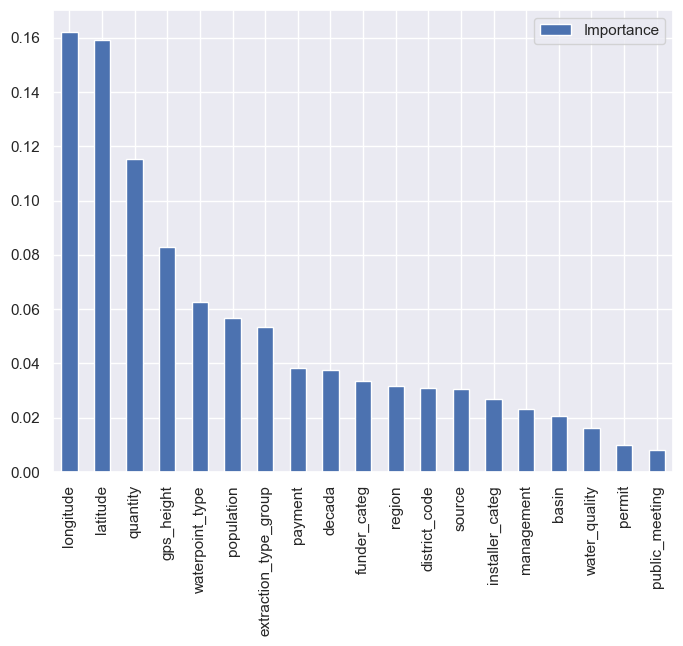

In [218]:
# Representacion grafica de la importancia de cada variable al modelo
feat_importances = pd.DataFrame(RF_mod.feature_importances_, index=X_train.columns, columns=["Importance"])
feat_importances.sort_values(by='Importance', ascending=False, inplace=True)
feat_importances.plot(kind='bar', figsize=(8,6))

In [219]:
# Propocion de la importancia de cada variable del modelo
feat_importances

,Importance
longitude,0.162107
latitude,0.159177
quantity,0.115381
gps_height,0.082902
waterpoint_type,0.062465
population,0.056536
extraction_type_group,0.053247
payment,0.038403
decada,0.037686
funder_categ,0.033590


Las variables *longitude, latitude, quantity, gps_height, waterpoint_type, population, extraction_type_group* son las que mejor funcionan para predecir. 

De momento con RandomForestClassifier, hemos obtenido los mejor resultados (modelo **RF_mod**). Vamos a probar con otro por si acaso:

#### Linear Support Vector Classification (LinearSVC)

In [220]:
# MODELO DE CLASIFICACION con Linear Support Vector Classification.
# Eleccion del modelo, instaciamiento con LinearSVC y ajuste:
LSVC_mod = LinearSVC(penalty='l1', dual= False).fit(X_train, y_train)
# Prediccion:
LSVC_pred = LSVC_mod.predict(X_test)

print(classification_report(y_test, LSVC_pred))

              precision    recall  f1-score   support

           0       0.67      0.82      0.73      6452
           1       0.00      0.00      0.00       863
           2       0.64      0.55      0.59      4565

    accuracy                           0.66     11880
   macro avg       0.44      0.46      0.44     11880
weighted avg       0.61      0.66      0.63     11880



C:\Users\maria\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\maria\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\maria\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Comprobamos que NO ha mejorado, al contrario, empeora. Por tanto, nos quedamos con **RandomForestClassifier (modelo: RF_mod ; y_pred: RF_pred)**


#### FORMA AUTOMATICA DE COMPARAR DIFERENTES ALGORITMOS
Hasta ahora mismo hemos ido probando modelo a modelo, pero exiten metodos para realizar de manera automatica todo lo anterio. Comenzamos realizando un funcion *rskf_comparison* donde le meteremos 4 modelos. Asi podremos probar dos modelos nuevos mas que son XGBClassifier y LogisticRegression (este modelo no suele funcionar bien en los modelos multiclase) :

XGB
accuracy: 0.78092 +/- 0.00578
-------------------------
RF
accuracy: 0.79947 +/- 0.00521
-------------------------
Tree
accuracy: 0.75060 +/- 0.00608
-------------------------
Log
accuracy: 0.64920 +/- 0.00643
-------------------------


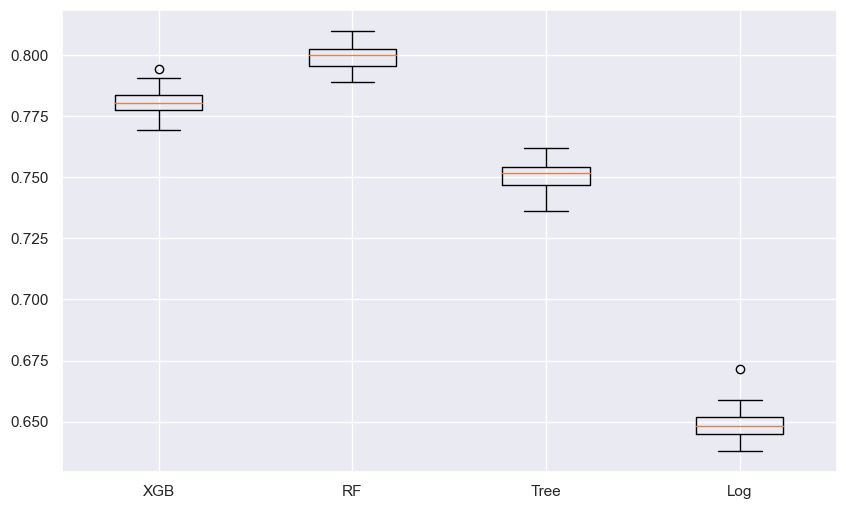

In [221]:
# Ejemplo de codigo para comparar sobre un nº de modelos, en este caso 4
# (XGB,RF,Tree,Log ), para ver cual de los 4 funciona mejor

models_rcv = {
    "XGB": XGBClassifier(n_jobs=-1, n_estimators=30, random_state=1234),
    "RF": RandomForestClassifier(n_estimators =30, n_jobs=-1, random_state=1234),
    "Tree": DecisionTreeClassifier(random_state=1234),
    "Log": LogisticRegression(solver="newton-cg", penalty="l2"),
}

def rskf_comparison(models, X_train, y_train):
    
    results = []
    names = []

    for k, v in models.items():
    
        rskf = RepeatedStratifiedKFold(n_splits=10, n_repeats=3, random_state=1234) 
        cv_scores = cross_val_score(v, X_train, y_train, scoring='accuracy', cv=rskf, n_jobs=-1)

        results.append(cv_scores)
        names.append(k)

        print(k)
        print('accuracy: %.5f +/- %.5f' % (np.mean(cv_scores), np.std(cv_scores)))
        print('-------------------------')
        
    
    return(results, names)


results, names = rskf_comparison(models_rcv, X_train, y_train)
plt.figure(figsize=(10, 6))
comparison = plt.boxplot(results)
plt.xticks(np.arange(1,len(names)+1),names)
plt.show(comparison)

Continuamos viendo que RandomForestClassifier es el mejor por su mayor % de precision para la prediccion. Destacar que XGBClassifier, tambien se adapta y tiene un % de precision bueno.

In [222]:
## Realizamos la CV con el mejor modelo

# Validación cruzada

cv = cross_val_score(
    RF_mod,
    X_train, 
    y_train,
    scoring = "accuracy",
    cv = 5
)
print(cv)
print("CV accuracy:", cv.mean(), np.std(cv))

[0.79608586 0.79892677 0.80702862 0.80029461 0.79713805]
CV accuracy: 0.7998947811447812 0.0038495724165922866


Hemos obtenido 5 prediciones (cv = 5) :  [0.79608586 0.79892677 0.80702862 0.80029461 0.79713805]

Vemos que la desviacion tipica entre ellas es muy baja (0.0038495724165922866), lo cual, quiere decir que el modelo que hemos obtenido no tiene overfitting (el modelo no esta sobreajustado). 


**Con RandomForestClassifier, se hizo un primer intento de de prediccion, del cual se obtuvo un score de 0.8065:**

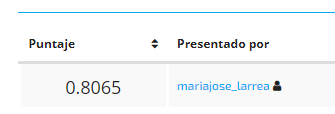

Ahora vamos a ver métodos de mejora de modelos, para mejorar el score del concurso:

#### Tuning hiperparámetros

Realiza una selección de hiper-parámetros.

- Grid Search: técnica usada para la selección de hiper-parámetros del entrenamiento de un modelo. Se realiza mediante los siguientes parámetros:
    - estimator: el modelo que se ha de evaluar
    - param_grid: un diccionario donde se indican los parámetros a evaluar como clave y el conjunto elementos como valor
    - cv: el número de conjuntos en los que se divide los datos para la validacióncruzada
    
Vamos a realizarlo con Grid Search, para ver que hiperparametros funcionan mejor a nuestro mejor modelo hasta ahora, que es **RF_mod** de RandomForestClassifier:

In [221]:
# Diccionario de parametros (meteremos los hiperparametros para que haga pruebas)
grid_param = {
    'n_estimators': [30, 50, 100, 200],
    'criterion': ['gini', 'entropy'],
    'bootstrap': [True, False],
    'max_depth': [20,22,24]
}

In [222]:
# Para que sea de manera estratificada el modelo de Grid
stratified_kfold = StratifiedKFold(n_splits=5,
                                       shuffle=True,
                                       random_state=11)

In [223]:
# Para sacar el modelo Grid (modelo sacado a partir de RF_mod y ya entrenado y con validazion cruzada ya hecha)
model_grid = GridSearchCV(estimator=RF_mod ,
                     param_grid=grid_param,
                     scoring='accuracy',  #aqui metemos la metrica que queramos mejorar
                     cv=stratified_kfold, #para hacer ya la CV
                     n_jobs=-1)

In [224]:
# Ajuste con los conjuntos de entranemiento del model_grid
model_grid.fit(X_train, y_train)

GridSearchCV(cv=StratifiedKFold(n_splits=5, random_state=11, shuffle=True),
             estimator=RandomForestClassifier(), n_jobs=-1,
             param_grid={'bootstrap': [True, False],
                         'criterion': ['gini', 'entropy'],
                         'max_depth': [20, 22, 24],
                         'n_estimators': [30, 50, 100, 200]},
             scoring='accuracy')

In [341]:
# Para obtener cuales son los mejores hiperparamtros
print(model_grid.best_params_)

{'bootstrap': True, 'criterion': 'gini', 'max_depth': 20, 'n_estimators': 200}


In [342]:
# Para obtener el mejor score
print(model_grid.best_score_)

0.8061658249158249


In [231]:
# Metricas del RandomForest del modelo 'RF_mod'
print(classification_report(y_test,RF_pred))

              precision    recall  f1-score   support

           0       0.81      0.88      0.85      6452
           1       0.54      0.35      0.43       863
           2       0.84      0.79      0.81      4565

    accuracy                           0.81     11880
   macro avg       0.73      0.67      0.70     11880
weighted avg       0.80      0.81      0.80     11880



In [223]:
# MODELO DE CLASIFICACION con RandomForestClassifier + Grid Search .
RFGrid_mod = RandomForestClassifier(bootstrap=True, criterion = 'entropy', max_depth = 20, n_estimators= 200).fit(X_train, y_train)
RFGrid_pred = RFGrid_mod.predict(X_test)

print(classification_report(y_test, RFGrid_pred))

              precision    recall  f1-score   support

           0       0.80      0.90      0.85      6452
           1       0.58      0.32      0.41       863
           2       0.85      0.77      0.81      4565

    accuracy                           0.81     11880
   macro avg       0.74      0.67      0.69     11880
weighted avg       0.81      0.81      0.80     11880



A simple vista, muy similar el modelo de RandomForestClassifier con el RandomForestClassifier + Grid Search, pero si nos fijamos bien, la clase **1** ha mejorado la precesion, siendo ahora de 0.58. El **accuracy** continua siendo de 0.81. 

Preferimos este modelo de **RandomForestClassifier + Grid Search (modelo: RFGrid_mod ; y_pred: RFGrid_pred)**

**Con RandomForestClassifier + Grid Search, se hizo un segundo intento de de prediccion, del cual se obtuvo un score de 0.8124:**
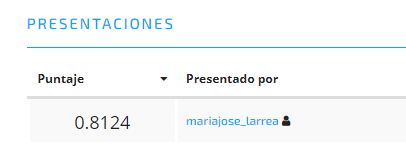


Vamos con otro metodo de mejora de modelos, para mejorar el score del concurso:

#### SMOTE

In [324]:
## Se prueba aplicando a SMOTE un *sampling_strategy={0: 32259, 1: 12903, 2: 22824}*:

print("Before OverSampling, counts of label '1': {}".format(sum(df.status_group==1)))
print("Before OverSampling, counts of label '0': {}".format(sum(df.status_group==0)))
print("Before OverSampling, counts of label '2': {}".format(sum(df.status_group==2)))

sm = SMOTE(sampling_strategy={0: 32259, 1: 12903, 2: 22824}, random_state=2)
df_res, y_res = sm.fit_resample(df.drop('status_group', axis=1), df.status_group.ravel())

print('After OverSampling, the shape of train_X: {}'.format(df_res.shape))
print('After OverSampling, the shape of train_y: {}'.format(y_res.shape))

print("After OverSampling, counts of label '1': {}".format(sum(y_res==1)))
print("After OverSampling, counts of label '0': {}".format(sum(y_res==0)))
print("After OverSampling, counts of label '2': {}".format(sum(y_res==2)))

Before OverSampling, counts of label '1': 4317
Before OverSampling, counts of label '0': 32259
Before OverSampling, counts of label '2': 22824
After OverSampling, the shape of train_X: (67986, 19)
After OverSampling, the shape of train_y: (67986,)
After OverSampling, counts of label '1': 12903
After OverSampling, counts of label '0': 32259
After OverSampling, counts of label '0': 22824


In [363]:
X_train_res, X_test_res, y_train_res, y_test_res = train_test_split (df_res, 
                                                     y_res,
                                                     test_size = 0.2,
                                                     random_state = 0,
                                                     stratify = y_res)

In [370]:
RFGridSm_mod = RandomForestClassifier(bootstrap=True, criterion = 'entropy', max_depth = 20, n_estimators= 200).fit(X_train_res, y_train_res)
RFGridSm_pred = RFGridSm_mod.predict(X_test_res)

print(classification_report(y_test_res, RFGridSm_pred))

              precision    recall  f1-score   support

           0       0.82      0.83      0.82      6452
           1       0.86      0.92      0.89      6452
           2       0.87      0.79      0.83      6452

    accuracy                           0.85     19356
   macro avg       0.85      0.85      0.85     19356
weighted avg       0.85      0.85      0.85     19356



A simple vista vemos que la precision a mejorado en todos. El accuracy tambien a mejorado, ahora esta en 0.85.

**Con RandomForestClassifier + Grid Search+ Smote, se hizo un tercer intento de de prediccion, del cual se obtuvo un score de 0.7857:**
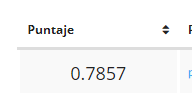

Este menor score a pesar de tener una mejor precision, se debe a que el modelo lo estamos realizando con datos de entrenamiento. A la hora de hacer la prediccion, estamos con los datos de test, por tanto, para entrenamiento el RandomForestClassifier + Grid Search+ Smote vemos que va perfectamente, pero para test no. 

# PASO 9: AUTOMATIZACION

Sino queremos hacer todo el proceso anterior (probar modelo uno a uno). Se puede sacar sus metricas y obtener el mejor moledo de manera automatica.

In [232]:
##### PRUEBA con pycaret para ver de manera automatica el mejor modelo ####

# Importar
import pycaret
from pycaret.classification import *

In [233]:
#Setup 
model_setup = setup(data=df, target='status_group', session_id=1)

,Description,Value
0,Session id,1
1,Target,status_group
2,Target type,Multiclass
3,Original data shape,"(59400, 20)"
4,Transformed data shape,"(59400, 20)"
5,Transformed train set shape,"(41580, 20)"
6,Transformed test set shape,"(17820, 20)"
7,Numeric features,19
8,Preprocess,True
9,Imputation type,simple


In [234]:
# Para ver todos los modelos con los que se ha trabajado en setup
models()

,Name,Reference,Turbo
ID,,,
lr,Logistic Regression,sklearn.linear_model._logistic.LogisticRegression,True
knn,K Neighbors Classifier,sklearn.neighbors._classification.KNeighborsCl...,True
nb,Naive Bayes,sklearn.naive_bayes.GaussianNB,True
dt,Decision Tree Classifier,sklearn.tree._classes.DecisionTreeClassifier,True
svm,SVM - Linear Kernel,sklearn.linear_model._stochastic_gradient.SGDC...,True
rbfsvm,SVM - Radial Kernel,sklearn.svm._classes.SVC,False
gpc,Gaussian Process Classifier,sklearn.gaussian_process._gpc.GaussianProcessC...,False
mlp,MLP Classifier,sklearn.neural_network._multilayer_perceptron....,False
ridge,Ridge Classifier,sklearn.linear_model._ridge.RidgeClassifier,True


In [235]:
# Comparacion de modelos, para saber cuales son los mejores modelos
best_models = compare_models()

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC,TT (Sec)
rf,Random Forest Classifier,0.8018,0.9007,0.8018,0.7953,0.7959,0.6306,0.6331,1.1650
xgboost,Extreme Gradient Boosting,0.7952,0.8973,0.7952,0.7917,0.7838,0.6096,0.6180,1.0500
et,Extra Trees Classifier,0.7887,0.8871,0.7887,0.7829,0.7847,0.6101,0.6111,1.1170
lightgbm,Light Gradient Boosting Machine,0.7863,0.8902,0.7863,0.7868,0.7722,0.5885,0.6016,1.7540
gbc,Gradient Boosting Classifier,0.7529,0.8516,0.7529,0.7561,0.7315,0.5165,0.5368,1.2540
dt,Decision Tree Classifier,0.7498,0.7792,0.7498,0.7494,0.7496,0.5464,0.5464,0.8760
ada,Ada Boost Classifier,0.7221,0.8074,0.7221,0.7120,0.6970,0.4568,0.4711,1.0240
knn,K Neighbors Classifier,0.6604,0.7454,0.6604,0.6488,0.6474,0.3529,0.3591,3.2920
ridge,Ridge Classifier,0.6527,0.0000,0.6527,0.6031,0.6224,0.3185,0.3281,0.7830
lr,Logistic Regression,0.6515,0.7373,0.6515,0.6121,0.6222,0.3179,0.3266,1.1350


Processing:   0%|          | 0/65 [00:00<?, ?it/s]

Como vemos, este metodo es la mejor forma de obtener el mejor modelo de forma facil y rápida. En este caso, lo estamos usando para refutar lo visto antes, Random Forest Classifier continua siendo el mejor modelo. 

# PASO 10: CON LOS DATOS DE TEST, VAMOS A PREDECIR

In [224]:
# Lectura de datos
df_test_set =pd.read_csv('df_test_limpio2.csv')
df_test_set.head()

,id,gps_height,longitude,latitude,basin,region,district_code,population,public_meeting,permit,extraction_type_group,management,payment,water_quality,quantity,source,waterpoint_type,funder_categ,installer_categ,decada
0,50785,1996,35.290799,-4.059696,4,19,3,321,1,1,3,6,1,1,4,5,3,21,21,6
1,51630,1569,36.656709,-3.309214,2,6,2,300,1,1,1,1,1,1,2,1,1,1,1,5
2,17168,1567,34.767863,-5.004344,4,14,2,500,1,1,3,1,1,1,2,5,3,2,2,6
3,45559,267,38.058046,-9.418672,8,20,43,250,1,1,3,1,4,1,3,2,3,21,21,3
4,49871,1260,35.006123,-10.950412,8,10,3,60,1,1,1,3,3,1,1,1,1,21,21,5


In [225]:
df_test_set.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 14850 entries, 0 to 14849
Data columns (total 20 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   id                     14850 non-null  int64  
 1   gps_height             14850 non-null  int64  
 2   longitude              14850 non-null  float64
 3   latitude               14850 non-null  float64
 4   basin                  14850 non-null  int64  
 5   region                 14850 non-null  int64  
 6   district_code          14850 non-null  int64  
 7   population             14850 non-null  int64  
 8   public_meeting         14850 non-null  int64  
 9   permit                 14850 non-null  int64  
 10  extraction_type_group  14850 non-null  int64  
 11  management             14850 non-null  int64  
 12  payment                14850 non-null  int64  
 13  water_quality          14850 non-null  int64  
 14  quantity               14850 non-null  int64  
 15  so

In [226]:
# Establecer como indice 'id' del datafreme df_train_set
df_test_set.set_index('id',inplace=True)

In [227]:
model_pred = RFGrid_mod.predict(df_test_set)
model_pred = (pd.DataFrame(model_pred,columns=['status_group'],index=df_test_set.index))

In [228]:
model_pred

,status_group
id,
50785,0
51630,0
17168,0
45559,2
49871,0
...,...
39307,2
18990,0
28749,0


In [229]:
model_pred.status_group.replace((0,2,1),('functional','non functional','functional needs repair'),inplace=True)
model_pred

,status_group
id,
50785,functional
51630,functional
17168,functional
45559,non functional
49871,functional
...,...
39307,non functional
18990,functional
28749,functional


In [230]:
# score 81,24
model_pred.to_csv('resultado_mj2.csv')